<a href="https://colab.research.google.com/github/tincho-mehaudy/DMCyT/blob/master/ArchivosLatex/TP1_Cluster_Todo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# T.P. 1 Algoritmos de Clustering sobre archivos de Spotify

## Levantamos dataset del PreTP

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot')

from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

pca = PCA(n_components=2)

# Para visuzalización en notebook
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl
import seaborn as sns
mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['font.size'] = 14
from IPython.display import Audio, Markdown, Image

def dmd(x):
    display(Markdown(x))

# Números y Datos
import numpy as np
import pandas as pd
import random

# Clustering (scipy)
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster

# Clustering (sklearn)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import adjusted_rand_score, silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors

# Clustering (otros)
!pip install gower
import gower

!pip install scikit-learn-extra 
from sklearn_extra.cluster import KMedoids 

from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster


import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['font.size'] = 22
from IPython.display import Audio, Markdown, Image, YouTubeVideo, HTML

# Machine learning
from sklearn.datasets import samples_generator, fetch_openml, load_digits
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import MDS, Isomap, SpectralEmbedding, TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

**Levantamos el archivo pickle generado como resultado del PRE-TP1**

In [72]:
import pickle
df_total = pd.read_pickle('df_total.p')
# mostramos dimensiones y primeros registros
print(df_total.shape)
df_total.head(10)

(4082, 71)


,id,mp0,mp1,mp2,mp3,mp4,mp5,mp6,mp7,mp8,mp9,mp10,mp11,sdp0,sdp1,sdp2,sdp3,sdp4,sdp5,sdp6,sdp7,sdp8,sdp9,sdp10,sdp11,mt0,mt1,mt2,mt3,mt4,mt5,mt6,mt7,mt8,mt9,mt10,mt11,sdt0,sdt1,sdt2,sdt3,sdt4,sdt5,sdt6,sdt7,sdt8,sdt9,sdt10,sdt11,mt0_norm,artists,genre,release_date,album_name,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,speechiness_log,liveness_log,valence_log,valence_logit,acousticness_logit,instrumentalness_logit,energy_logit,loudness_logit
0,00At7PWydsvg7g5xgaYan9,0.354425,0.747412,0.286733,0.296011,0.303938,0.244281,0.300585,0.215238,0.425981,0.295721,0.338112,0.418549,0.630479,0.656402,0.436778,0.553574,0.570886,0.422492,0.545740,0.328688,0.595697,0.633451,0.665306,0.756192,0.942322,0.817997,0.555805,0.430032,0.664287,0.403409,0.520597,0.469829,0.463558,0.582029,0.613871,0.399939,0.253537,0.179836,0.256836,0.318495,0.242994,0.290617,0.318734,0.231227,0.139287,0.252666,0.261510,0.278275,0.698685,Matrix & Futurebound,drum-and-bass,2012,All I Know EP (feat. Luke Bingham),0.533827,0.927814,0.939500,0.057293,0.273092,0.003182,0.026639,0.817259,0.810248,-1.172031,-1.436055,-0.082359,1.566324,-0.929174,-4.315647,2.713416,2.933962
1,00BgcUYkIImsDN5rNjkR1U,0.233490,0.532633,0.119782,0.159206,0.311303,0.206850,0.411964,0.296472,0.577764,0.431916,0.343720,0.283267,0.524528,0.760283,0.262473,0.412054,0.679838,0.539311,0.770593,0.593922,0.793390,0.849812,0.597048,0.708635,0.921531,0.766888,0.395599,0.362725,0.593063,0.302356,0.538773,0.440944,0.328459,0.441780,0.653630,0.447183,0.301479,0.331171,0.300520,0.206070,0.395573,0.283929,0.359724,0.212639,0.321871,0.235968,0.310301,0.411293,0.658823,Maduk,drum-and-bass,2013,Feel Good,0.382664,0.942853,0.949102,0.046208,0.006235,0.557576,0.070934,0.104569,0.814705,-1.250204,-1.091867,-0.940935,-2.044902,-4.104221,0.271967,3.006179,3.154919
2,00WgnFIsY1y84p7mYAJRuF,0.510113,0.361699,0.416151,0.564027,0.381998,0.362252,0.395394,0.643339,0.437220,0.321494,0.458258,0.288363,0.764317,0.626131,0.668801,0.804309,0.630595,0.659452,0.727147,0.754426,0.745920,0.691701,0.657127,0.554382,0.772360,0.725894,0.502340,0.458222,0.515849,0.287753,0.670784,0.440100,0.290859,0.374617,0.782501,0.590861,0.517235,0.268070,0.677909,0.287937,0.521776,0.352472,0.469454,0.215663,0.332264,0.323902,0.290750,0.327383,0.515605,Apex,drum-and-bass,2012,Omega Point EP,0.468288,0.921798,0.855093,0.071529,0.000853,0.823232,0.076613,0.113706,0.815129,-1.088690,-1.062415,-0.907611,-1.957798,-4.512363,1.608711,2.614645,1.858252
3,00X2ieWUjpzdNwDU2Jlg6i,0.570225,0.575522,0.628908,0.371218,0.520357,0.314152,0.328446,0.503845,0.353149,0.402552,0.312743,0.404121,0.708006,0.624321,0.671485,0.445515,0.629442,0.464817,0.464944,0.660873,0.448533,0.627020,0.429563,0.550132,0.918607,0.728133,0.519574,0.339290,0.437220,0.454525,0.568017,0.500888,0.556014,0.518627,0.629329,0.351479,0.166163,0.113579,0.141874,0.217190,0.167308,0.221088,0.233026,0.193597,0.255875,0.268884,0.225137,0.247147,0.652674,The Mighty Mighty Bosstones,ska,2002,A Jackknife to a Swan,0.464059,0.956889,0.897723,0.051925,0.003574,0.000001,0.351575,0.730964,0.419984,-1.208132,-0.441802,-0.130203,1.050987,-4.285910,-4.594985,3.374210,2.286145
4,00isAURAZeKQXv6CW2vckb,0.350877,0.527437,0.231017,0.405664,0.214982,0.358833,0.264363,0.268953,0.415337,0.195314,0.375656,0.170481,0.660800,0.733016,0.441898,0.809989,0.436888,0.734512,0.606309,0.521148,0.705501,0.449678,0.711889,0.379830,0.523043,0.463577,0.573599,0.320815,0.582131,0.457297,0.529303,0.440957,0.700266,0.381577,0.659275,0.292890,0.404852,0.350354,0.259792,0.299978,0.325703,0.132756,0.786040,0.210715,0.593866,0.277373,0.254452,0.632434,0.410900,Gottfried Heinrich Stölzel,classical,2015,Divine Redeemer,0.238901,0.154819,0.575625,0.044224,0.940763,0.446465,0.113061,0.082335,0.320465,-1.265808,-0.909878,-1.034634,-2.285452,2.960621,-0.174584,-1.622804,0.345908
5,00kO4Z0mFAFs6KLlXnaD0f,0.440426,0.730124,0.217593,0.138963,0.079061,0.061542,0.078785,0.142725,0.567773,0.095690,0.12

In [73]:
# columnas del dataset
df_total.columns

Index(['id', 'mp0', 'mp1', 'mp2', 'mp3', 'mp4', 'mp5', 'mp6', 'mp7', 'mp8',
       'mp9', 'mp10', 'mp11', 'sdp0', 'sdp1', 'sdp2', 'sdp3', 'sdp4', 'sdp5',
       'sdp6', 'sdp7', 'sdp8', 'sdp9', 'sdp10', 'sdp11', 'mt0', 'mt1', 'mt2',
       'mt3', 'mt4', 'mt5', 'mt6', 'mt7', 'mt8', 'mt9', 'mt10', 'mt11', 'sdt0',
       'sdt1', 'sdt2', 'sdt3', 'sdt4', 'sdt5', 'sdt6', 'sdt7', 'sdt8', 'sdt9',
       'sdt10', 'sdt11', 'mt0_norm', 'artists', 'genre', 'release_date',
       'album_name', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'speechiness_log', 'liveness_log', 'valence_log', 'valence_logit',
       'acousticness_logit', 'instrumentalness_logit', 'energy_logit',
       'loudness_logit'],
      dtype='object')

In [74]:
# tipos de datos de las columnas
df_total.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4082 entries, 0 to 4081
Data columns (total 71 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      4082 non-null   object 
 1   mp0                     4082 non-null   float64
 2   mp1                     4082 non-null   float64
 3   mp2                     4082 non-null   float64
 4   mp3                     4082 non-null   float64
 5   mp4                     4082 non-null   float64
 6   mp5                     4082 non-null   float64
 7   mp6                     4082 non-null   float64
 8   mp7                     4082 non-null   float64
 9   mp8                     4082 non-null   float64
 10  mp9                     4082 non-null   float64
 11  mp10                    4082 non-null   float64
 12  mp11                    4082 non-null   float64
 13  sdp0                    4082 non-null   float64
 14  sdp1                    4082 non-null   

Transformamos las categorias a números para usarlas los labels numéricos:

In [75]:
df_total['genre_num']= pd.factorize(df_total['genre'])[0]
df_total[['genre_num','genre']].value_counts()

genre_num  genre            
4          death-metal          486
1          ska                  477
0          drum-and-bass        477
6          trance               475
5          opera                461
8          singer-songwriter    447
7          ambient              442
3          jazz                 421
2          classical            396
dtype: int64

Funciones auxiliares

In [180]:
# silhoutte pertenece a los metodos de VALIDACION INTERNA/NO SUPERVISADA
# esta es la funcion para graficar coeficiente de silhouette, que se usa más adelante
import matplotlib.cm as cm

def grafica_silhouette_2(labels_,d):
  k=len(labels_.unique())
  #silhouette_avg = silhouette_score(d,labels_,metric='precomputed')
  #sample_silhouette_values = silhouette_samples(d,labels_,metric='precomputed')

  silhouette_avg = silhouette_score(d,labels_)
  sample_silhouette_values = silhouette_samples(d,labels_)

  print("The average silhouette is",silhouette_avg)

  plt.rcParams['figure.figsize'] = (8,6)
  plt.xlim([-0.1, 1])
  plt.ylim([0, len(labels_) + (k + 1) * 10])

  y_lower = 10
  for i in range(k):
      ith_cluster_silhouette_values = sample_silhouette_values[labels_ == i]

      ith_cluster_silhouette_values.sort()

      size_cluster_i = ith_cluster_silhouette_values.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / k)
      plt.fill_betweenx(np.arange(y_lower, y_upper),
                        0, ith_cluster_silhouette_values,
                        facecolor=color, edgecolor=color, alpha=0.7)

      plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      y_lower = y_upper + 10

  plt.title(("Silhouette analysis on sample data "
                "with k = %d" % k),
                fontsize=14, fontweight='bold')
  plt.xlabel("The silhouette coefficient values",fontsize=14)
  plt.ylabel("Cluster label",fontsize=14)

  # The vertical line for average silhouette score of all the values
  plt.axvline(x=silhouette_avg, color="red", linestyle="--")

  plt.yticks([])  # Clear the yaxis labels / ticks
  plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
  plt.tick_params(axis='both',labelsize=12)
  plt.show()

  

In [182]:
def grafica_silhouette_p(labels_,d):
  k=len(labels_.unique())
  silhouette_avg = silhouette_score(d,labels_,metric='precomputed')
  sample_silhouette_values = silhouette_samples(d,labels_,metric='precomputed')
  print("The average silhouette is",silhouette_avg)
  
  plt.rcParams['figure.figsize'] = (8,6)
  plt.xlim([-0.1, 1])
  plt.ylim([0, len(labels_) + (k + 1) * 10])

  y_lower = 10
  for i in range(k):
      ith_cluster_silhouette_values = sample_silhouette_values[labels_ == i]

      ith_cluster_silhouette_values.sort()

      size_cluster_i = ith_cluster_silhouette_values.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / k)
      plt.fill_betweenx(np.arange(y_lower, y_upper),
                        0, ith_cluster_silhouette_values,
                        facecolor=color, edgecolor=color, alpha=0.7)

      plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      y_lower = y_upper + 10

  
  plt.title(("Silhouette analysis on sample data "
                "with k = %d" % k),
                fontsize=14, fontweight='bold')
  plt.xlabel("The silhouette coefficient values",fontsize=14)
  plt.ylabel("Cluster label",fontsize=14)

  # The vertical line for average silhouette score of all the values
  plt.axvline(x=silhouette_avg, color="red", linestyle="--")

  plt.yticks([])  # Clear the yaxis labels / ticks
  plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
  plt.tick_params(axis='both',labelsize=12)
  plt.show()

  

In [78]:
def calcula_sse_kmedoids(KM,d):
  se = []
  for i in range(0,KM.n_clusters):
    se.append(sum(d[KM.medoid_indices_[i],KM.labels_==i]**2))
  return sum(se)

In [79]:
def vanDongen(ct):
    n2=2*(sum(ct.apply(sum,axis=1)))
    sumi = sum(ct.apply(np.max,axis=1))
    sumj = sum(ct.apply(np.max,axis=0))
    maxsumi = np.max(ct.apply(sum,axis=1))
    maxsumj = np.max(ct.apply(sum,axis=0))
    vd = (n2 - sumi - sumj)/(n2 - maxsumi - maxsumj)
    return vd

In [80]:
def Hopkins(df,*args):
    n = df.shape[0] # filas
    d = df.shape[1] # columnas
    if not args:
        print("Numero de puntos al azar por defecto")
        m = int(0.1 * n) # cantidad de puntos al azar (default)
    else:
        m = args[0] # cantidad de puntos al azar

    nbrs = NearestNeighbors(n_neighbors=1, algorithm='brute').fit(df) # buscador de vecinos

    rand_ind = random.sample(range(0, n, 1), m) # indices al azar

    ui = []
    wi = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(np.random.normal(size=(1, d)).reshape(1, -1), 2, return_distance=True) # distancia a los nuevos puntos
        ui.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(df[rand_ind[j]].reshape(1, -1), 2, return_distance=True) # distancia a los puntos al azar
        wi.append(w_dist[0][1])

    H = sum(wi) / (sum(ui) + sum(wi))
    return H

In [193]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

def compara_silhouette_kmeans (X,range_n_clusters):

#print(__doc__)

#X= d_meta_total_1
#X=np.asarray(DF1)
#range_n_clusters = [4,9]

  for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)


    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.",fontsize=14)
    ax1.set_xlabel("The silhouette coefficient values",fontsize=14)
    ax1.set_ylabel("Cluster label",fontsize=14)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.",fontsize=14)
    ax2.set_xlabel("Feature space for the 1st feature",fontsize=14)
    ax2.set_ylabel("Feature space for the 2nd feature",fontsize=14)

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    ax1.tick_params(axis='both',labelsize=12)
    ax2.tick_params(axis='both',labelsize=12)

  plt.show()

In [253]:
def compara_silhouette_kmeds (X,range_n_clusters):

#print(__doc__)

#X= d_meta_total_1
#X=np.asarray(DF1)
#range_n_clusters = [4,9]

  for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMedoids(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)


    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.",fontsize=14)
    ax1.set_xlabel("The silhouette coefficient values",fontsize=14)
    ax1.set_ylabel("Cluster label",fontsize=14)

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.",fontsize=14)
    ax2.set_xlabel("Feature space for the 1st feature",fontsize=14)
    ax2.set_ylabel("Feature space for the 2nd feature",fontsize=14)

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    ax1.tick_params(axis='both',labelsize=12)
    ax2.tick_params(axis='both',labelsize=12)

  plt.show()

In [240]:
def grafica_SIL_SSE_KMEANS(X):

  range_k = [i for i in range(2,15)]
  silh = []
  sse = []
  for k in range_k:
    KM_meta = KMeans(n_clusters=k, random_state=47).fit(X)
  
    silhouette_avg = silhouette_score(X,KM_meta.labels_)

    silh.append(silhouette_avg)
    #print("Para", k,"clusters, el promedio del score de silhouette es:", round(silhouette_avg,4))
    
    sse.append(KM_meta.inertia_)

  plt.plot(range_k,silh,'r.-')
  plt.ylabel('Silhouette promedio', fontsize=14)
  plt.tick_params(axis='both',labelsize=12)
  plt.show()

  plt.plot(range_k,sse,'r.-')
  plt.ylabel('SSE',fontsize=14)
  plt.tick_params(axis='both',labelsize=12)
  plt.show()

In [263]:
def grafica_SIL_SSE_KMEDIODS(X):
  range_k = [i for i in range(2,15)]
  silh = []
  sse = []
  for k in range_k:
    KM_meta =KMedoids(n_clusters=k, random_state=0).fit(X)  

    silhouette_avg = silhouette_score(X,KM_meta.labels_, metric='euclidean')

    silh.append(silhouette_avg)
    #print("Para", k,"clusters, el promedio del score de silhouette es:", round(silhouette_avg,4))
    
    sse.append(KM_meta.inertia_)

  plt.plot(range_k,silh,'r.-')
  plt.ylabel('Silhouette promedio', fontsize=14)
  plt.tick_params(axis='both',labelsize=12)
  plt.show()

  plt.plot(range_k,sse,'r.-')
  plt.ylabel('SSE', fontsize=14)
  plt.tick_params(axis='both',labelsize=12)
  plt.show()


In [369]:
def indices_cofeneticos_varios(X):
  X=scaler.fit_transform(X)

  metrica='euclidean'
  z1 = linkage(X, method='centroid', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo centroide y metrica", metrica,c)

  z1 = linkage(X, method='average', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo average y metrica", metrica,c)

  z1 = linkage(X, method='complete', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo complete y metrica", metrica,c)

  z1 = linkage(X, method='single', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo single y metrica", metrica,c)

  z1 = linkage(X, method='ward', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo ward y metrica", metrica,c)

  z1 = linkage(X, method='median', metric=metrica)
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo median y metrica", metrica,c)

  metrica='chebyshev'
  z1 = linkage(X, method='average', metric='chebyshev')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo average y metrica", metrica,c)

  z1 = linkage(X, method='complete', metric='chebyshev')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo complete y metrica", metrica,c)

  z1 = linkage(X, method='single', metric='chebyshev')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo single y metrica", metrica,c)

  metrica='mahalanobis'
  z1 = linkage(X, method='average', metric='mahalanobis')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo average y metrica", metrica,c)

  z1 = linkage(X, method='complete', metric='mahalanobis')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo complete y metrica", metrica,c)

  z1 = linkage(X, method='single', metric='mahalanobis')
  c, coph_dists = cophenet(z1, pdist(X))
  print ("Indice cofenetico para metodo single y metrica", metrica,c)

## Generamos 5 conjuntos de datos.
Aplicaremos varios algoritmos de cluster. Las caracteristicas de estos dataframe son:

*   DF1 - Todas las variables numéricas, sin los NA
*   DF2 - Sólo con las variables de timbres y pitches
*   DF3 - Sólo con las variables de timbres
*   DF4 - Sólo con las variables de pitches
*   DF5 - Sólo con Audio Features (Alto Nivel)


**Generamos DF1- Todas las variables numéricas, elimino NA:**

In [115]:
# pregunta aca, estaban ambas columnas valence_log y valence_logit, no habria que sacar una??
DF = df_total.drop(['id','artists','album_name','release_date','mt0','valence','acousticness', 
                   'instrumentalness','energy','loudness'], axis=1)
#DF = df_total.drop(['id','artists','album_name','release_date'], axis=1)   

In [116]:
DF.columns

Index(['mp0', 'mp1', 'mp2', 'mp3', 'mp4', 'mp5', 'mp6', 'mp7', 'mp8', 'mp9',
       'mp10', 'mp11', 'sdp0', 'sdp1', 'sdp2', 'sdp3', 'sdp4', 'sdp5', 'sdp6',
       'sdp7', 'sdp8', 'sdp9', 'sdp10', 'sdp11', 'mt1', 'mt2', 'mt3', 'mt4',
       'mt5', 'mt6', 'mt7', 'mt8', 'mt9', 'mt10', 'mt11', 'sdt0', 'sdt1',
       'sdt2', 'sdt3', 'sdt4', 'sdt5', 'sdt6', 'sdt7', 'sdt8', 'sdt9', 'sdt10',
       'sdt11', 'mt0_norm', 'genre', 'danceability', 'speechiness', 'liveness',
       'tempo', 'speechiness_log', 'liveness_log', 'valence_log',
       'valence_logit', 'acousticness_logit', 'instrumentalness_logit',
       'energy_logit', 'loudness_logit', 'genre_num'],
      dtype='object')

In [117]:
DF.describe()

,mp0,mp1,mp2,mp3,mp4,mp5,mp6,mp7,mp8,mp9,mp10,mp11,sdp0,sdp1,sdp2,sdp3,sdp4,sdp5,sdp6,sdp7,sdp8,sdp9,sdp10,sdp11,mt1,mt2,mt3,mt4,mt5,mt6,mt7,mt8,mt9,mt10,mt11,sdt0,sdt1,sdt2,sdt3,sdt4,sdt5,sdt6,sdt7,sdt8,sdt9,sdt10,sdt11,mt0_norm,danceability,speechiness,liveness,tempo,speechiness_log,liveness_log,valence_log,valence_logit,acousticness_logit,instrumentalness_logit,energy_logit,loudness_logit,genre_num
count,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4082.000000,4072.000000,3883.000000,4076.000000,3987.000000,4080.000000,4082.000000
mean,0.423272,0.423572,0.353962,0.316589,0.370451,0.347341,0.326951,0.377515,0.366869,0.335787,0.355752,0.359382,0.675741,0.609789,0.552372,0.540770,0.566645,0.584126,0.552165,0.589333,0.569079,0.607693,0.579709,0.609147,0.652434,0.454329,0.347099,0.488849,0.455531,0.498971,0.451841,0.501737,0.454321,0.649670,0.455323,0.347884,0.294116,0.355238,0.343339,0.309646,0.299003,0.383638,0.237526,0.333564,0.332525,0.305088,0.365583,0.499820,0.467091,0.077912,0.179050,0.568494,-1.121462,-0.851121,-0.609834,-0.771688,-0.958999,-1.214661,0.483124,1.259677,3.993386
std,0.159062,0.170415,0.145745,0.133497,0.140917,0.139016,0.132923,0.138726,0.149836,0.132053,0.152625,0.142635,0.127206,0.119438,0.148457,0.158454,0.145660,0.157576,0.143710,0.139580,0.149576,0.147409,0.153142,0.156341,0.149923,0.137816,0.086089,0.139687,0.132954,0.119778,0.068404,0.114588,0.114920,0.113207,0.106899,0.144550,0.132992,0.148998,0.150020,0.115805,0.150634,0.139610,0.101092,0.126101,0.123216,0.133927,0.131261,0.096604,0.196402,0.066009,0.171933,0.153869,0.212149,0.317548,0.408604,1.649446,3.432915,2.955575,2.322026,0.935900,2.592131
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005533,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,-2.000000,-2.000000,-4.595120,-4.595120,-4.595120,-4.595120,-4.595120,0.000000
25%,0.310479,0.297935,0.248284,0.221841,0.270508,0.251850,0.235678,0.281424,0.257842,0.247190,0.247666,0.257582,0.605565,0.548565,0.458183,0.441066,0.470723,0.475537,0.460192,0.504140,0.479849,0.518175,0.483594,0.514859,0.565341,0.362424,0.291169,0.410262,0.376519,0.428919,0.415901,0.428507,0.373986,0.587025,0.388019,0.248140,0.198744,0.254021,0.228980,0.230704,0.185251,0.291050,0.164891,0.248917,0.245990,0.206017,0.277027,0.435079,0.312896,0.044224,0.077336,0.440802,-1.265808,-1.058806,-0.925808,-2.005473,-4.461733,-4.523848,-1.262977,0.626074,2.000000
50%,0.422400,0.415484,0.347690,0.309562,0.365382,0.337414,0.316728,0.370589,0.355489,0.324698,0.344498,0.354061,0.690912,0.622150,0.564649,0.544285,0.573727,0.589771,0.559416,0.602079,0.578128,0.620356,0.584375,0.615629,0.673848,0.439126,0.346166,0.490571,0.456101,0.503711,0.452339,0.501915,0.451262,0.657730,0.456188,0.341995,0.289884,0.348842,0.331097,0.300413,0.285703,0.372724,0.227996,0.317910,0.319291,0.292246,0.351062,0.499853,0.476216,0.054492,0.105834,0.578489,-1.190491,-0.936165,-0.543418,-0.916683,-1.631577,-1.273929,0.277207,1.353399,4.000000
75%,0.537655,0.551067,0.450179,0.398198,0.459756,0.435823,0.4088

In [118]:
DF = DF.dropna()

In [ ]:
DF.info(verbose=True)

Aplicamos Silhouette para ver si este conjunto de datos se agrupa naturalmente por los géneros dados:

The average silhouette is 0.056219216


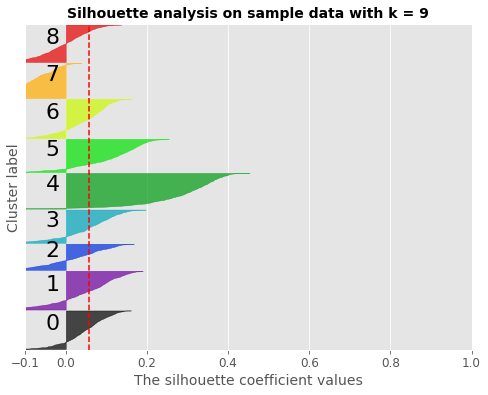

In [183]:
d_meta_total_1 = DF.drop(['genre','genre_num'], axis=1)   
d_meta_total_1 = gower.gower_matrix(d_meta_total_1)

grafica_silhouette_p(DF['genre_num'],d_meta_total_1)

(OJO HAY QUE VLVER A ANALIZARLOS)Los generos que estan peor clasificados son, 6-trace y 7-ambiente. Se destacan bien clasificados el 4 -death-metal y 5- opera. Los generos 1-ska y 0- drum-and-bass, bastante bien clasificados tambien.

**Generamos DF2 - Solo con las variables de timbres y pitches:**

In [86]:
DF2 = df_total.drop(['id','artists','album_name','release_date','danceability', 'energy',
       'loudness', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'speechiness_log', 'liveness_log',
       'valence_log', 'valence_logit', 'acousticness_logit',
       'instrumentalness_logit', 'energy_logit', 'loudness_logit','mt0'], axis=1)   
# 'genre',

In [ ]:
DF2.info(verbose=True)

Aplicamos Silhouette para ver si este conjunto de datos se agrupa naturalmente por los géneros dados:

The average silhouette is 0.039881337


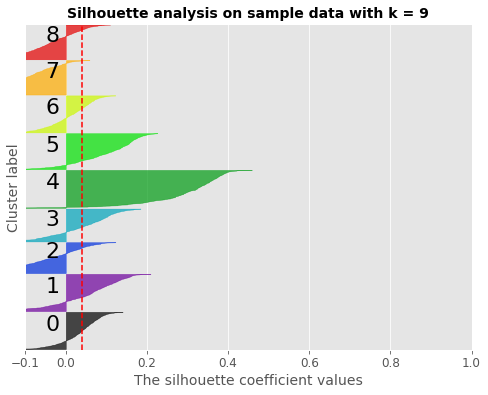

In [184]:
d_meta_total_2 = DF2.drop(['genre','genre_num'], axis=1)   
d_meta_total_2 = gower.gower_matrix(d_meta_total_2)

grafica_silhouette_p(DF2['genre_num'],d_meta_total_2)

Los generos que estan peor clasificados son 8 -singer-songwriter, 7-ambient , 2-classical, en menor medida 6- trance . Estan bien clasificados el 4 -death-metal y 5- opera. Y los generos 1-ska y 0- drum-and-bass, bastante bien clasificados tambien.

**Generamos DF3 - Solo con las variables de timbres:**

In [90]:
DF3 = df_total.drop(['id','artists','album_name','release_date','danceability', 'energy',
       'loudness', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'speechiness_log', 'liveness_log',
       'valence_log', 'valence_logit', 'acousticness_logit',
       'instrumentalness_logit', 'energy_logit', 'loudness_logit','mp0', 'mp1', 'mp2', 'mp3', 'mp4', 'mp5', 'mp6', 'mp7', 'mp8', 'mp9',
       'mp10', 'mp11', 'sdp0', 'sdp1', 'sdp2', 'sdp3', 'sdp4', 'sdp5', 'sdp6',
       'sdp7', 'sdp8', 'sdp9', 'sdp10', 'sdp11','mt0_norm'], axis=1)   
#'genre

In [ ]:
DF3.info(verbose=True)

Aplicamos Silhouette para ver si este conjunto de datos se agrupa naturalmente por los géneros dados:

The average silhouette is 0.067377016


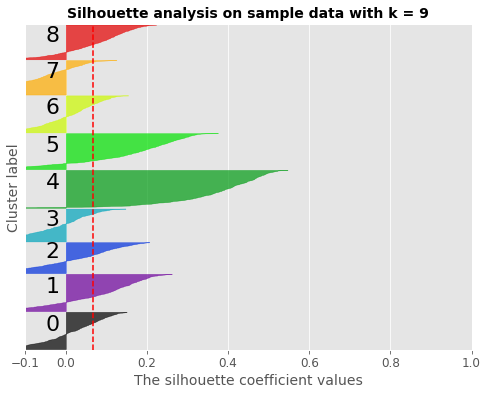

In [185]:
d_meta_total_3 = DF3.drop(['genre','genre_num'], axis=1)   
d_meta_total_3 = gower.gower_matrix(d_meta_total_3)

grafica_silhouette_p(DF3['genre_num'],d_meta_total_3)

El genero 7-ambient, es el peor clasificado. Le siguen en menor medida el 3-jazz,6-trance . El mejor clasificado es 4-death-metal, le siguen el 5-opera  y 1-ska , con una buena clasificacion



**Generamos DF4 - Solo con las variables de pitches:**

In [93]:
DF4 = df_total.drop(['id','artists','album_name','release_date','danceability', 'energy',
       'loudness', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'speechiness_log', 'liveness_log',
       'valence_log', 'valence_logit', 'acousticness_logit',
       'instrumentalness_logit', 'energy_logit', 'loudness_logit','mt0', 'mt1', 'mt2', 'mt3',
       'mt4', 'mt5', 'mt6', 'mt7', 'mt8', 'mt9', 'mt10', 'mt11', 'sdt0',
       'sdt1', 'sdt2', 'sdt3', 'sdt4', 'sdt5', 'sdt6', 'sdt7', 'sdt8', 'sdt9',
       'sdt10', 'sdt11', 'mt0_norm'], axis=1)   
#genre

In [ ]:
DF4.info(verbose=True)

Aplicamos Silhouette para ver si este conjunto de datos se agrupa naturalmente por los géneros dados:

The average silhouette is -0.031413026


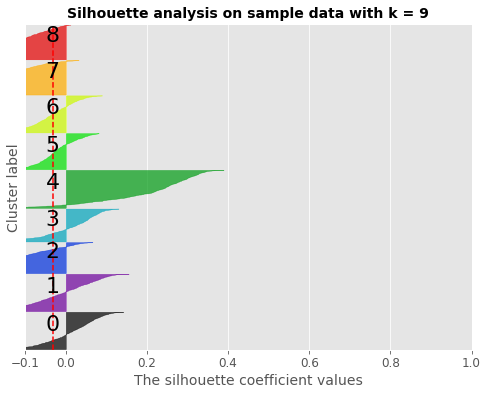

In [186]:
d_meta_total_4 = DF4.drop(['genre','genre_num'], axis=1)   
d_meta_total_4 = gower.gower_matrix(d_meta_total_4)

grafica_silhouette_p(DF4['genre_num'],d_meta_total_4)

REVISAR Los generos que estan peor clasificados son  7-ambient , 6- trance, 3-jazz , 0-drum-and-bass. El genero 4-death-metal, esta muy bien clasificado. Mientras que el 5-opera  y 1-ska , con una buena clasificacion

**Generamos DF5 - Solo con Audio Features (Alto Nivel):**

In [99]:
# pregunta aca, idem variable valence_log y valence_logit
DF5 = df_total[['danceability', 'tempo', 'speechiness_log', 'liveness_log',
       'valence_log', 'valence_logit', 'acousticness_logit',
       'instrumentalness_logit', 'energy_logit', 'loudness_logit','genre','genre_num']] 
DF5.head()

,danceability,tempo,speechiness_log,liveness_log,valence_log,valence_logit,acousticness_logit,instrumentalness_logit,energy_logit,loudness_logit,genre,genre_num
0,0.533827,0.810248,-1.172031,-1.436055,-0.082359,1.566324,-0.929174,-4.315647,2.713416,2.933962,drum-and-bass,0
1,0.382664,0.814705,-1.250204,-1.091867,-0.940935,-2.044902,-4.104221,0.271967,3.006179,3.154919,drum-and-bass,0
2,0.468288,0.815129,-1.088690,-1.062415,-0.907611,-1.957798,-4.512363,1.608711,2.614645,1.858252,drum-and-bass,0
3,0.464059,0.419984,-1.208132,-0.441802,-0.130203,1.050987,-4.285910,-4.594985,3.374210,2.286145,ska,1
4,0.238901,0.320465,-1.265808,-0.909878,-1.034634,-2.285452,2.960621,-0.174584,-1.622804,0.345908,classical,2


In [ ]:
DF5 = DF5.dropna()
DF5.info(verbose=True)

Aplicamos Silhouette para ver si este conjunto de datos se agrupa naturalmente por los géneros dados:

The average silhouette is 0.05737342


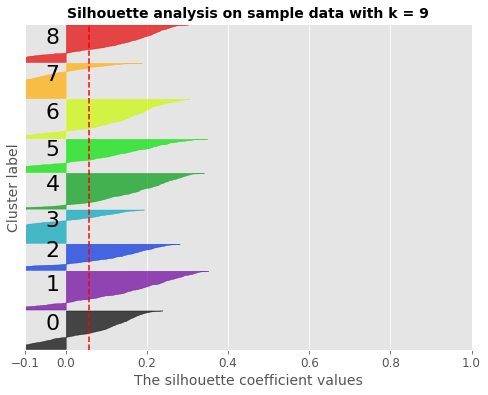

In [187]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

#antes escalamos los datos porque no acepta valores negativos
scaled_df = scaler.fit_transform(DF5.drop(['genre','genre_num'], axis=1))

d_meta_total_5 = scaled_df 
d_meta_total_5 = gower.gower_matrix(d_meta_total_5)

grafica_silhouette_p(DF5['genre_num'],d_meta_total_5)

REVISAR A excepcion del genero 4 -death-metal, los demas generos estan mal clasificados

# Algoritmo KMeans

## **DF1 - Todas las variables numéricas, sin los NA**



Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

In [156]:
DF1= DF.drop(['genre','genre_num'], axis=1)

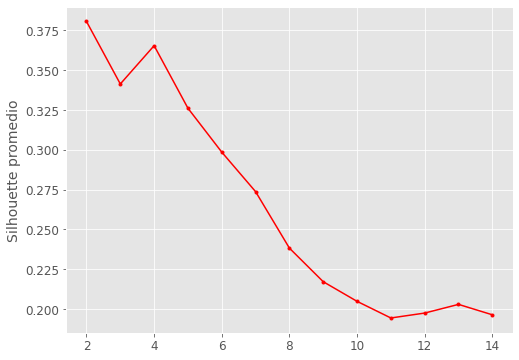

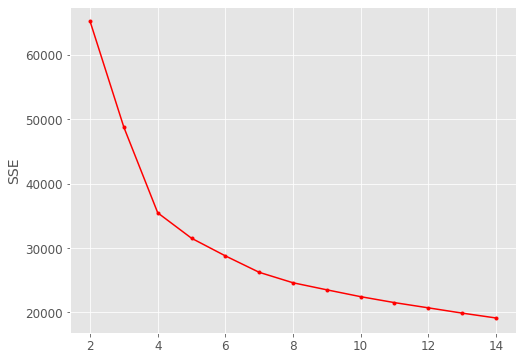

In [226]:
grafica_SIL_SSE(DF1)

For n_clusters = 4 The average silhouette_score is : 0.3654730185197661
For n_clusters = 9 The average silhouette_score is : 0.21651375789894853


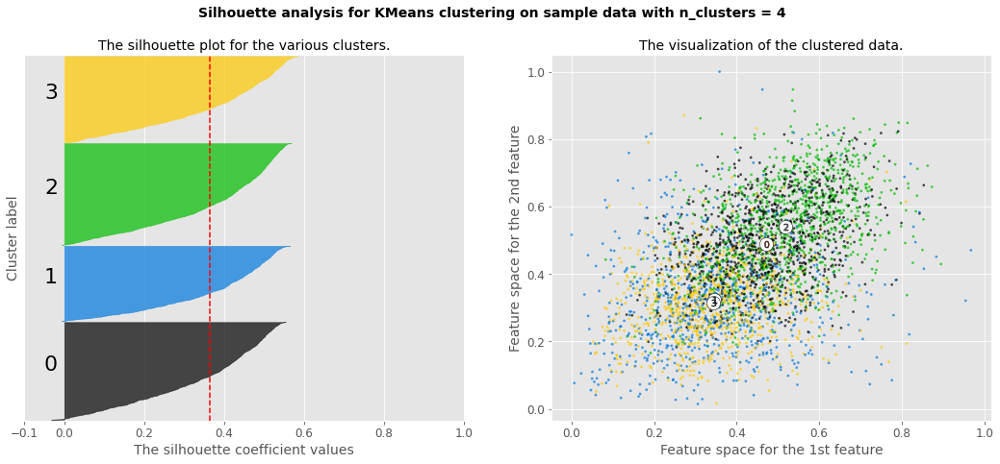

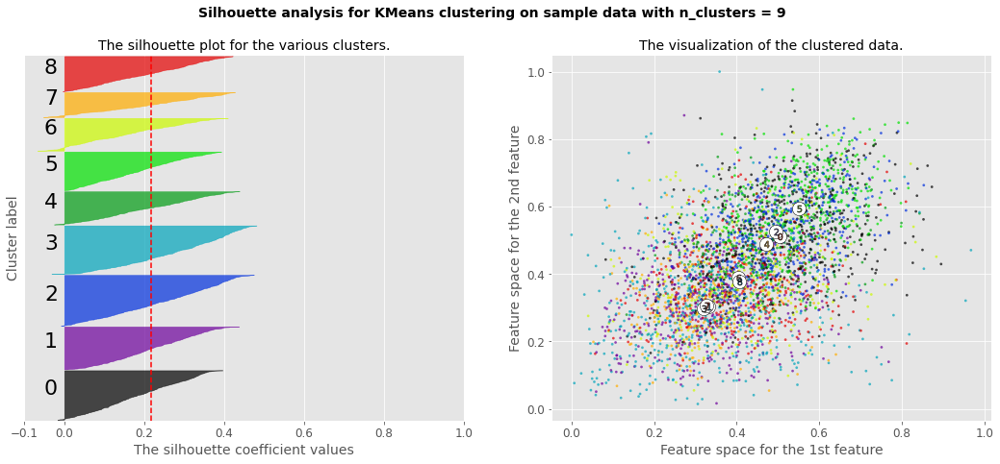

In [194]:
compara_silhouette_kmeans(np.asarray(DF1),[4,9])

Aplicamos el algoritmo kMeans para k=?. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [176]:
kmeans1 = KMeans(n_clusters=9, random_state=47).fit(DF1)

tmp1 = pd.DataFrame({'Labels': DF.genre, 'Clusters': kmeans1.labels_})# Create a DataFrame with labels and varieties as columns: df
ct1 = pd.crosstab(tmp1['Labels'], tmp1['Clusters']) # Create crosstab: ct
ct1

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,1,62,188,1,4,144,2,16,0
classical,1,0,225,0,25,36,0,24,0
death-metal,0,59,2,154,0,5,203,1,1
drum-and-bass,6,143,0,167,0,1,129,0,12
jazz,89,22,61,1,14,105,0,101,3
opera,9,0,28,0,209,9,0,139,0
singer-songwriter,185,3,8,16,11,19,0,172,31
ska,66,12,1,73,0,24,1,1,283
trance,15,242,4,128,0,6,50,0,19


### Indice de Rand 

In [153]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari1 = adjusted_rand_score(DF.genre, kmeans1.labels_)
ari1

0.2701988583080194

### Medida de Van Dongen
Medida mejorada de la pureza

In [155]:
vanDongen(ct1)
# este es el mejor indice?

0.5976747743613279

### El método de Hopkins 
Consiste en generar p puntos distribuidos al azar en el espacio muestral, y además extraer p puntos reales del dataset. Luego se calculan las distancias a los vecinos más próximos dentro del subconjunto de datos generados al azar (u) y dentro del subconjunto de datos extraídos del dataset (w), con estos se calcula el coeficiente de Hopkins (H) como sum_i(w_i)/(sum_i(u_i)+sum_i(w_i)). Si los nuevos puntos están igual de alejados que los tomados al azar, entonces sum(u) ~ sum(w) y H ~ 0.5. En cambio, si sum(u) >> sum(w), es decir que en promedio están menos agrupados los que se encuentran al azar, entonces H << 0.5.

In [154]:
Hopkins (scaler.fit_transform(DF1))

Numero de puntos al azar por defecto


0.07883839978148559

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411295]
Varianza explicada total 0.9748624683611976


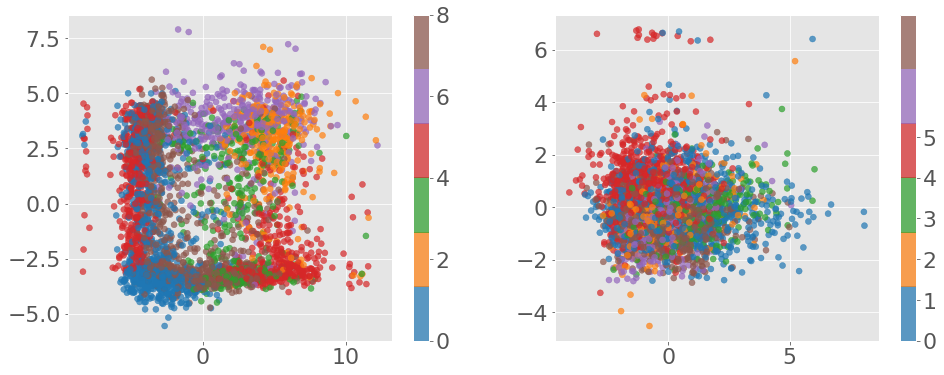

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF1)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

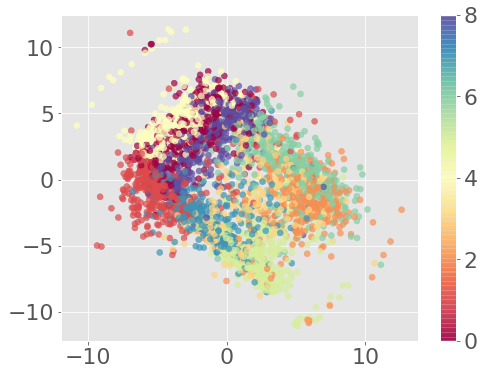

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

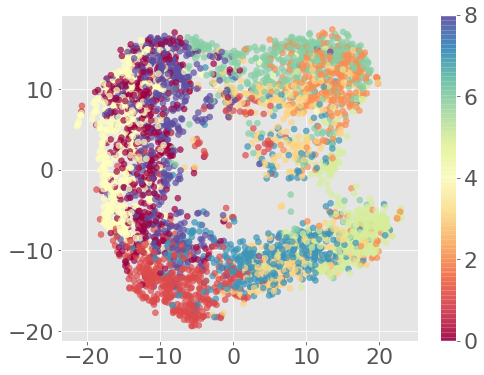

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF2 - Sólo con las variables de timbres y pitches

In [195]:
DF2_2= DF2.drop(['genre','genre_num'], axis=1)

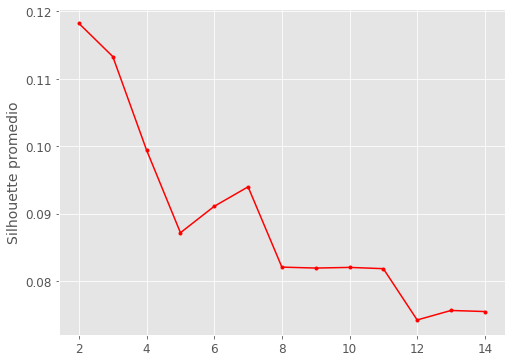

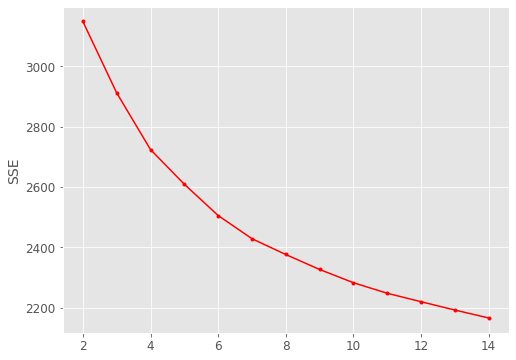

In [227]:
grafica_SIL_SSE(DF2_2)

For n_clusters = 3 The average silhouette_score is : 0.11331252470819693
For n_clusters = 9 The average silhouette_score is : 0.08635006404841133


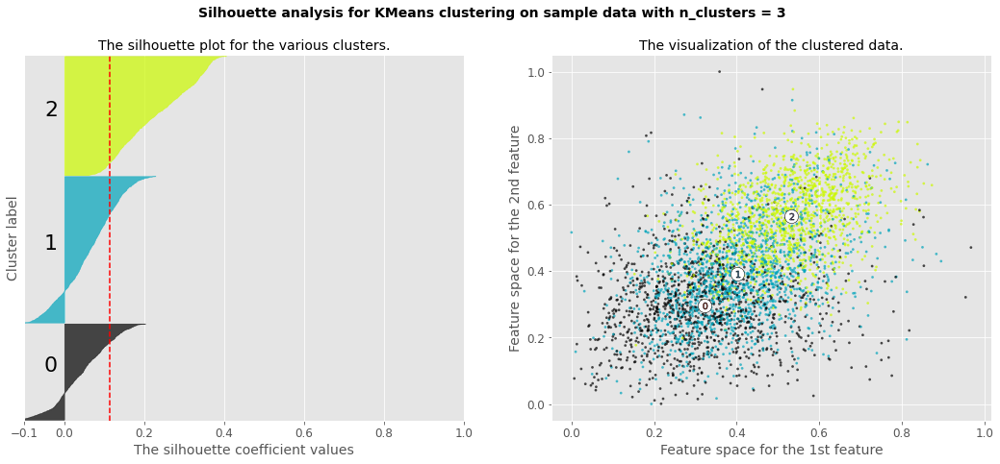

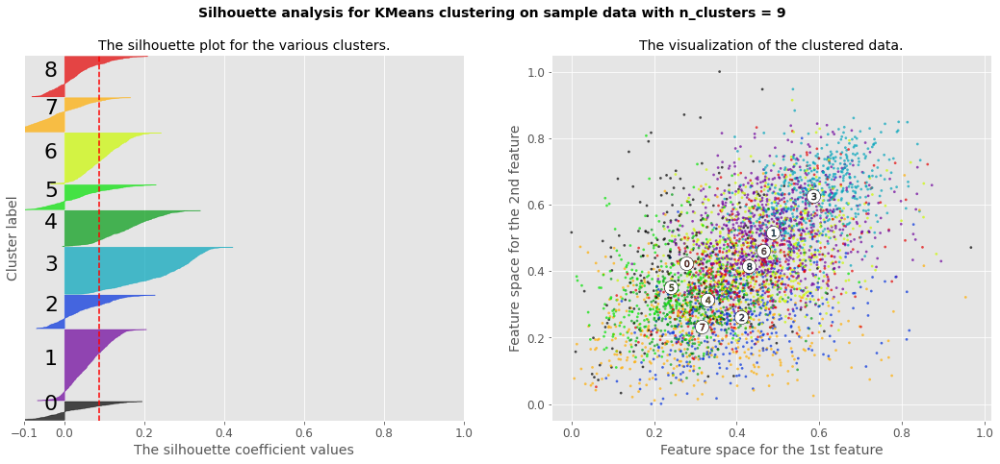

In [198]:
compara_silhouette_kmeans(np.asarray(DF2_2),[3,9])

In [200]:
kmeans2 = KMeans(n_clusters=9, random_state=0).fit(DF2_2)

tmp2 = pd.DataFrame({'Labels': DF2.genre, 'Clusters': kmeans2.labels_})# Create a DataFrame with labels and varieties as columns: df
ct2 = pd.crosstab(tmp2['Labels'], tmp2['Clusters']) # Create crosstab: ct
ct2

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,100,21,5,115,75,61,35,7,23
classical,101,16,2,51,69,66,1,86,4
death-metal,2,36,440,1,2,1,3,1,0
drum-and-bass,3,184,5,14,6,12,226,1,26
jazz,14,43,0,48,23,14,32,30,217
opera,19,18,0,33,36,34,0,308,13
singer-songwriter,53,35,0,87,109,65,4,0,94
ska,2,270,31,9,7,12,18,0,128
trance,3,98,4,10,13,15,298,2,32


Para esta combinacion de variables, la cantidad de clusters optimo es de 6, al igual que el caso anterior.

Calculamos los indices de Rand y Hopkins(?) y Van Dongen

In [201]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari2 = adjusted_rand_score(DF2.genre, kmeans2.labels_)
ari2

0.2891483283442294

In [202]:
Hopkins (scaler.fit_transform(DF2_2))

Numero de puntos al azar por defecto


0.07294662419653866

In [203]:
vanDongen(ct2)
# este es el mejor indice?

0.5973839298548225

**PCA**

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF2_2)
Y=pd.factorize(DF2.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF3 - Sólo con las variables de timbres

In [204]:
DF3_2= DF3.drop(['genre','genre_num'], axis=1)

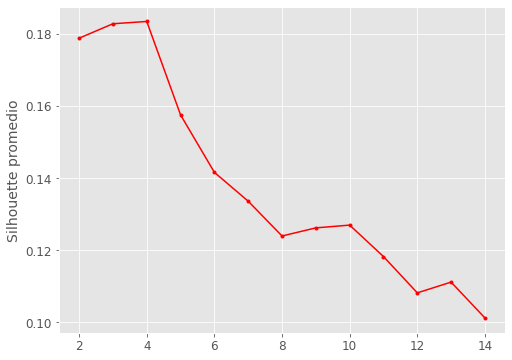

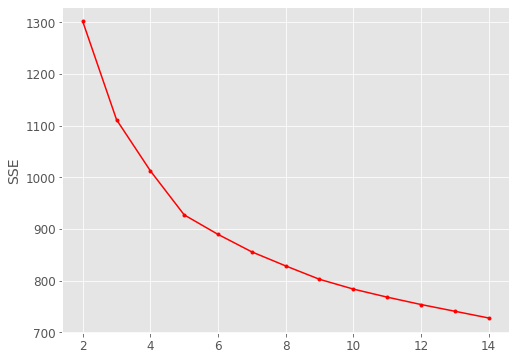

In [228]:
grafica_SIL_SSE(DF3_2)

For n_clusters = 4 The average silhouette_score is : 0.18352491320651537
For n_clusters = 9 The average silhouette_score is : 0.12703409327239373


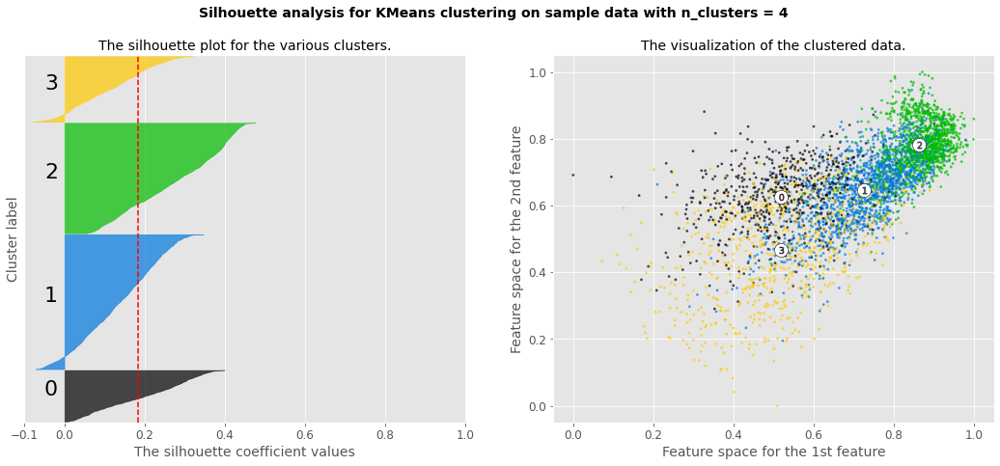

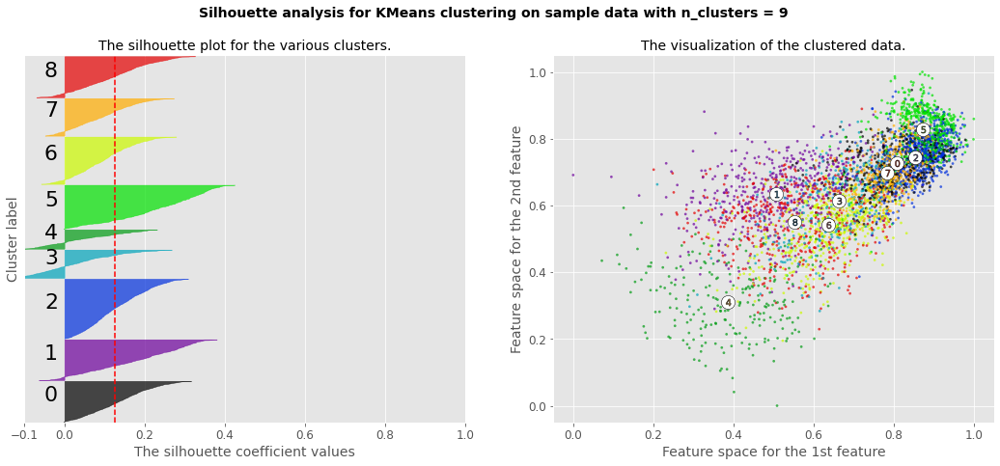

In [208]:
compara_silhouette_kmeans(np.asarray(DF3_2),[4,9])

In [209]:
kmeans3 = KMeans(n_clusters=9, random_state=0).fit(DF3_2)
kmeans3.labels_

tmp3 = pd.DataFrame({'Labels': DF3.genre, 'Clusters': kmeans3.labels_})# Create a DataFrame with labels and varieties as columns: df
ct3= pd.crosstab(tmp3['Labels'], tmp3['Clusters']) # Create crosstab: ct
ct3

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,1,112,16,20,134,9,16,13,121
classical,3,16,78,0,63,4,1,1,230
death-metal,2,0,0,41,1,435,0,2,5
drum-and-bass,17,5,0,267,0,6,20,161,1
jazz,74,145,23,19,7,1,126,14,12
opera,19,25,333,6,3,0,4,0,71
singer-songwriter,70,247,2,49,0,1,64,2,12
ska,265,4,0,119,0,27,58,4,0
trance,7,3,2,169,2,1,42,245,4


Si consideramos solo los atributos de timbres, la cantidad de clusters que mejor clasificac sería de 3.

Calculamos los indices de Rand y Hopkins(?) y Van Dongen

In [210]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari3 = adjusted_rand_score(DF3.genre, kmeans3.labels_)
ari3

0.34403501421051147

In [211]:
Hopkins (scaler.fit_transform(DF3_2))

Numero de puntos al azar por defecto


0.0562846581805044

In [212]:
vanDongen(ct3)
# este es el mejor indice?

0.5124499141385231

**PCA**

Varianza explicada [0.32111321 0.19142434 0.09025216 0.06768311 0.05001172 0.03816599]
Varianza explicada total 0.7586505262641811


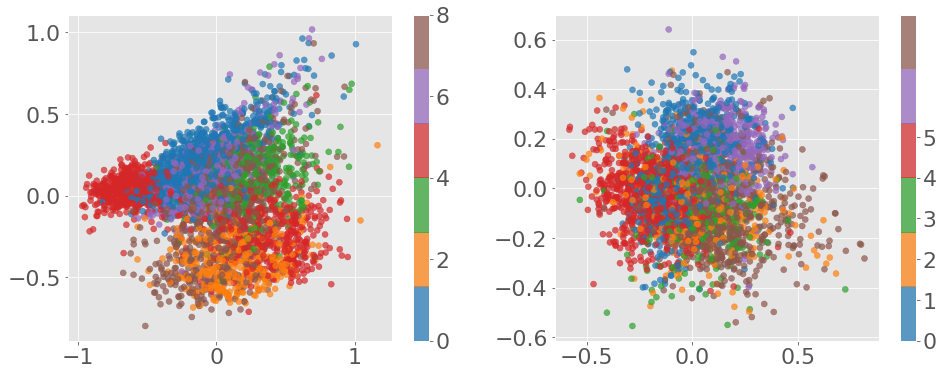

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF3_2)
Y=pd.factorize(DF3.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

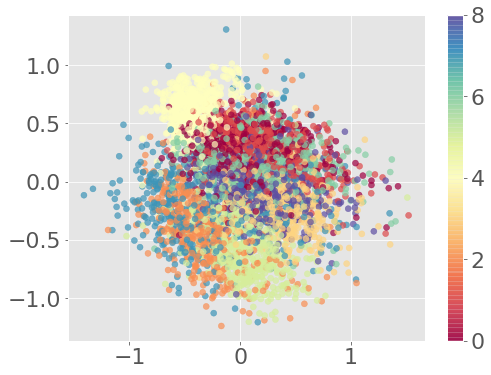

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF3_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

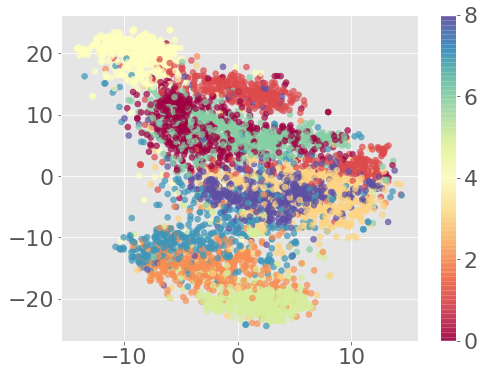

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF3_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF4 - Sólo con las variables de pitches

In [213]:
DF4_2= DF4.drop(['genre','genre_num'], axis=1)

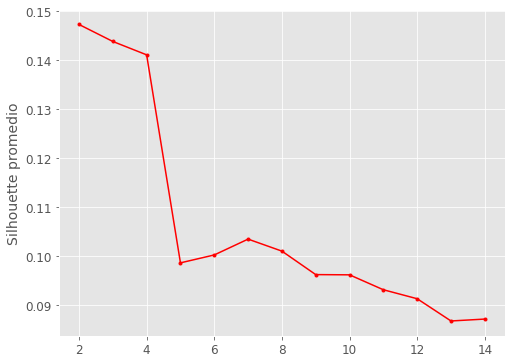

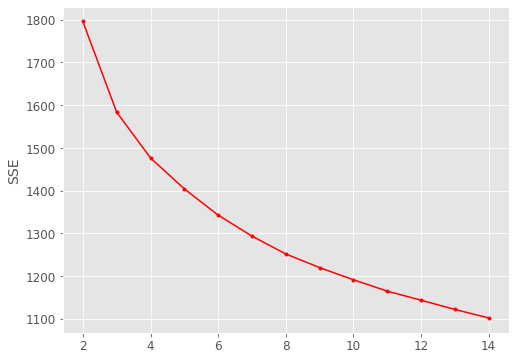

In [229]:
grafica_SIL_SSE(DF4_2)

For n_clusters = 3 The average silhouette_score is : 0.14402095093914044
For n_clusters = 9 The average silhouette_score is : 0.0966040526983277


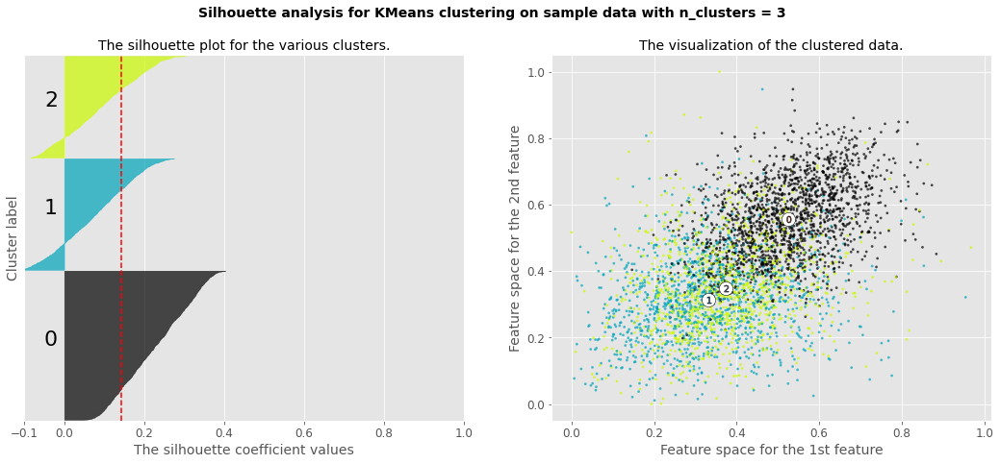

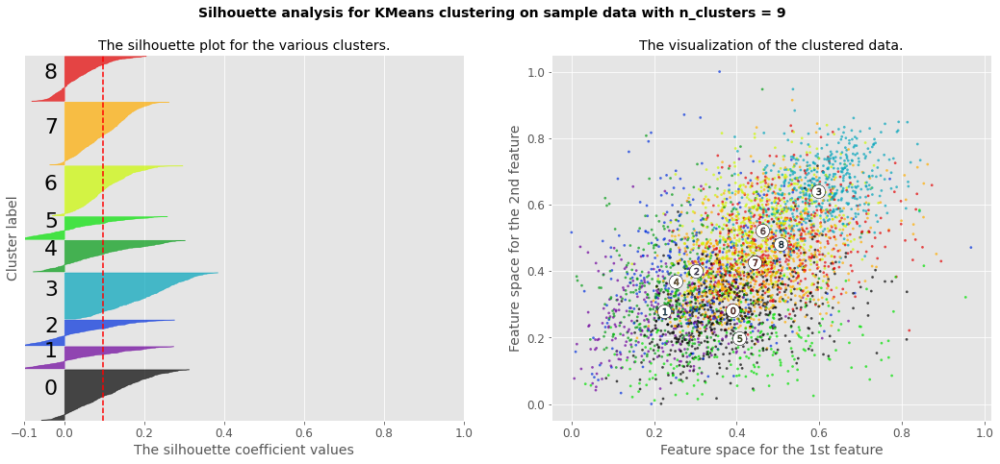

In [215]:
compara_silhouette_kmeans(np.asarray(DF4_2),[3,9])

In [216]:
kmeans4 = KMeans(n_clusters=9, random_state=0).fit(DF4_2)
kmeans4.labels_

tmp4 = pd.DataFrame({'Labels': DF4.genre, 'Clusters': kmeans4.labels_})# Create a DataFrame with labels and varieties as columns: df
ct4= pd.crosstab(tmp4['Labels'], tmp4['Clusters']) # Create crosstab: ct
ct4

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,6,57,41,39,79,84,56,33,47
classical,2,51,81,6,79,30,62,18,67
death-metal,395,2,3,21,1,1,1,50,12
drum-and-bass,11,0,22,131,0,9,21,215,68
jazz,11,5,165,33,19,35,20,47,86
opera,2,21,131,6,27,48,69,42,115
singer-songwriter,2,67,70,15,60,60,71,14,88
ska,70,3,40,53,7,19,37,88,160
trance,38,0,16,202,0,6,18,123,72


Para este conjunto de datos, los clusters optimos son 3.

Calculamos los indices de Rand y Hopkins(?) y Van Dongen

In [222]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari4 = adjusted_rand_score(DF4.genre, kmeans4.labels_)
ari4

0.1488511557612359

In [218]:
Hopkins (scaler.fit_transform(DF4_2))

Numero de puntos al azar por defecto


0.06285516275820853

In [219]:
vanDongen(ct4)
# este es el mejor indice?

0.7475226195605342

**PCA**

Varianza explicada [0.20547765 0.16521381 0.12627058 0.08147408 0.06499146 0.06072791]
Varianza explicada total 0.7041554853392065


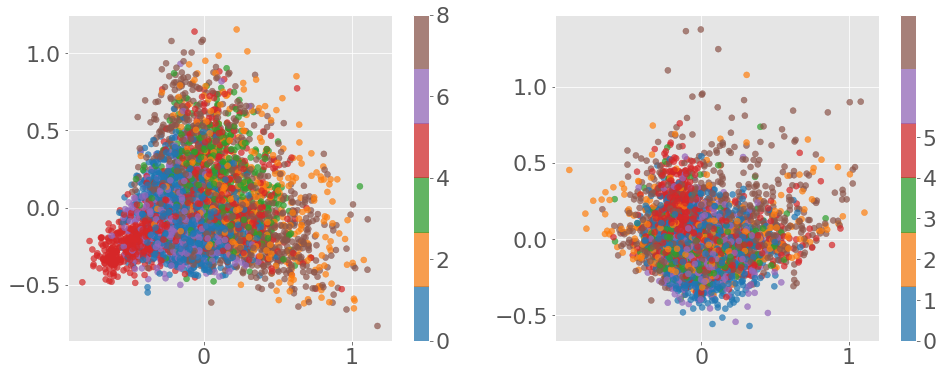

In [238]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF4_2)
Y=pd.factorize(DF4.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

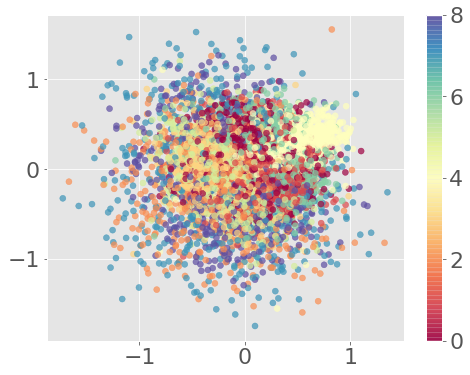

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF4_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

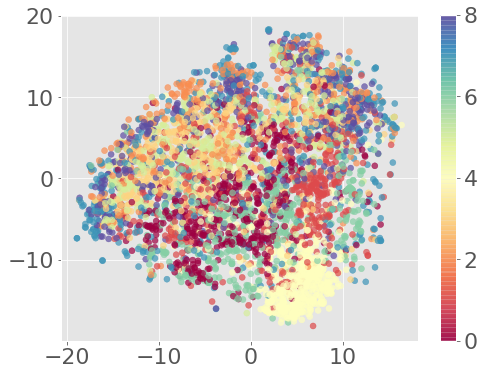

In [239]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF4_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF5 - Sólo con Audio Features (Alto Nivel)

In [231]:
DF5_2= DF5.drop(['genre','genre_num'], axis=1)

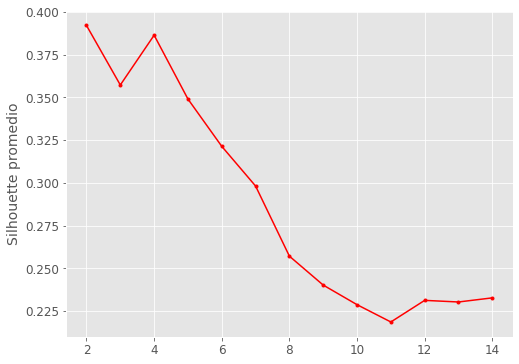

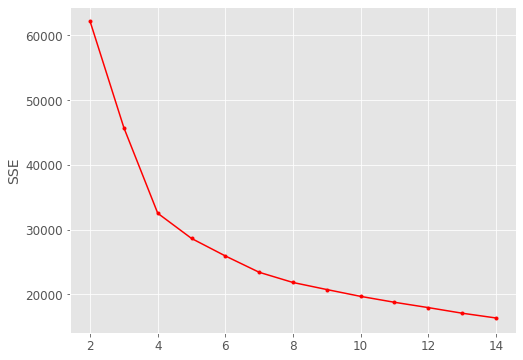

In [232]:
grafica_SIL_SSE(DF5_2)

For n_clusters = 4 The average silhouette_score is : 0.3864203471597798
For n_clusters = 9 The average silhouette_score is : 0.24480812573296454


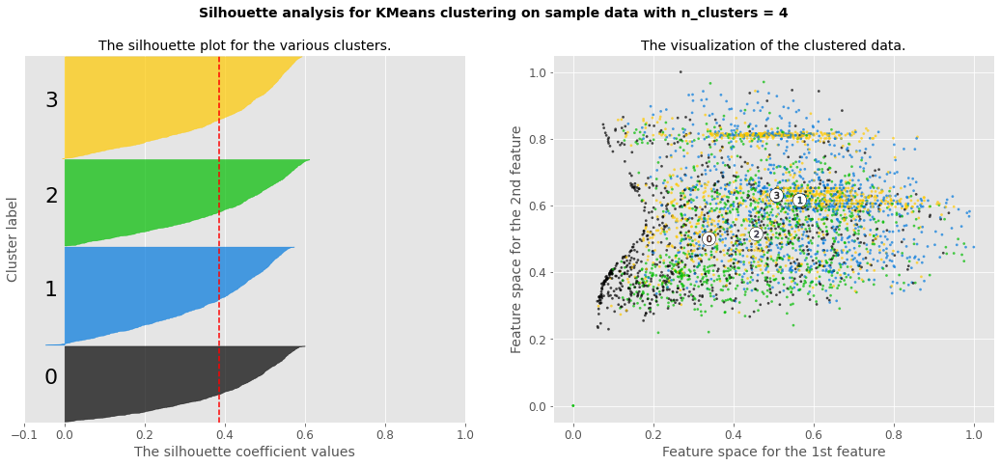

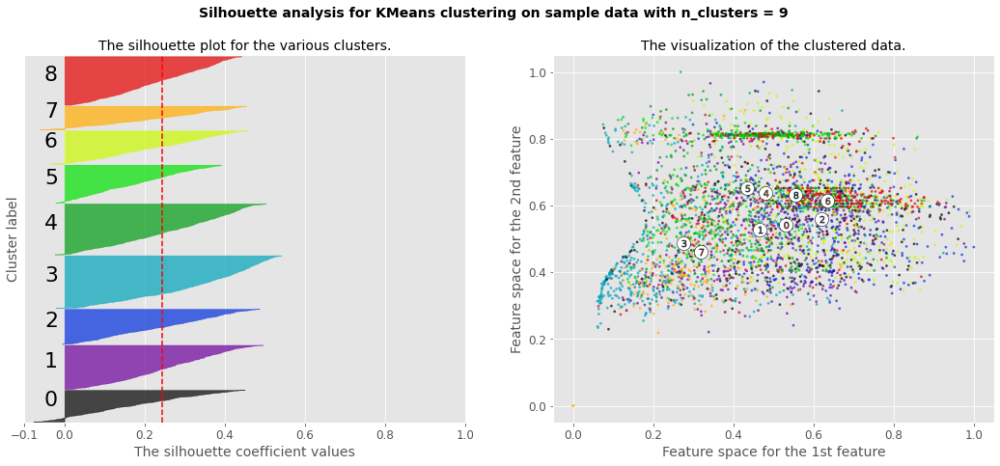

In [233]:
compara_silhouette_kmeans(np.asarray(DF5_2),[4,9])

In [234]:
kmeans5 = KMeans(n_clusters=9, random_state=0).fit(DF5_2)
kmeans5.labels_

tmp5 = pd.DataFrame({'Labels': DF5.genre, 'Clusters': kmeans5.labels_})# Create a DataFrame with labels and varieties as columns: df
ct5= pd.crosstab(tmp5['Labels'], tmp5['Clusters']) # Create crosstab: ct
ct5

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,1,48,3,10,10,101,66,0,179
classical,0,6,0,9,36,157,0,0,103
death-metal,155,1,206,2,0,1,56,0,4
drum-and-bass,165,4,140,2,0,0,132,15,0
jazz,1,93,0,144,42,44,16,16,40
opera,0,4,0,67,286,28,0,0,9
singer-songwriter,25,15,0,275,47,6,3,67,7
ska,90,36,3,16,0,1,6,309,0
trance,129,10,60,5,0,2,228,28,2


Calculamos los indices de Rand (Validacion Externa)y Hopkins(Tendencia al Clustering) y Van Dongen (Validacion Externa)

In [235]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari5 = adjusted_rand_score(DF5.genre, kmeans5.labels_)
ari5

0.28521512634263213

In [236]:
Hopkins (scaler.fit_transform(DF5_2))

Numero de puntos al azar por defecto


0.04815057074758667

In [237]:
vanDongen(ct5)
# este es el mejor indice?

0.5675468222290452

**PCA**

Varianza explicada [0.55365561 0.310585   0.0757516  0.04705507 0.00642806 0.00331682]
Varianza explicada total 0.9967921731825962


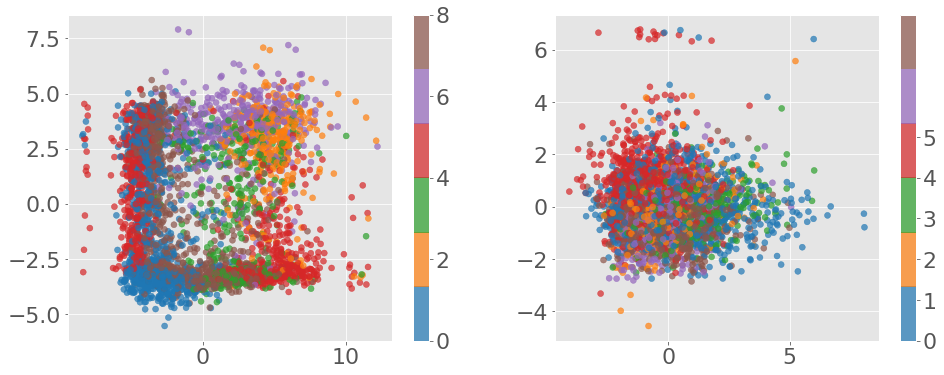

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF5_2)
Y=pd.factorize(DF5.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

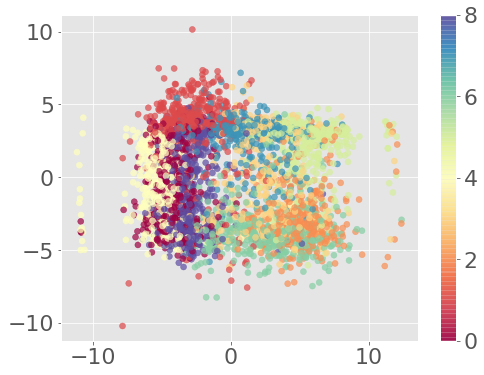

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF5_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

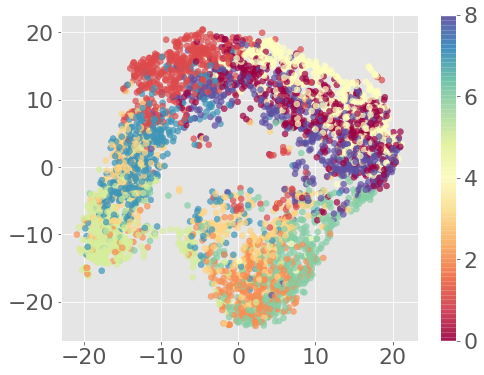

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF5_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

# Algoritmo PAM o KMedioides

##DF1 - Todas las variables numéricas, sin los NA



Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

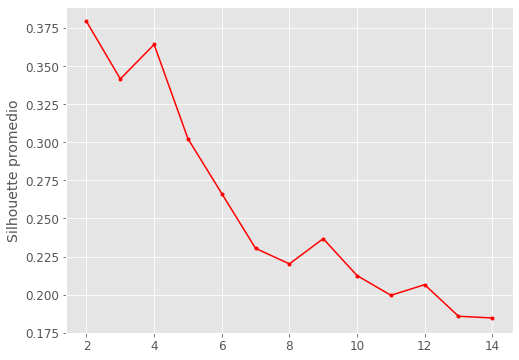

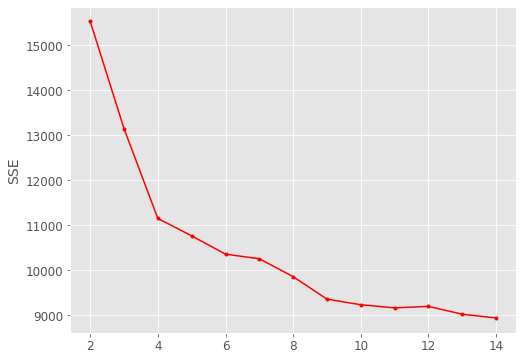

In [243]:
grafica_SIL_SSE_KMEDIODS(DF1)

For n_clusters = 4 The average silhouette_score is : 0.3641109059013848
For n_clusters = 9 The average silhouette_score is : 0.2367120215234466


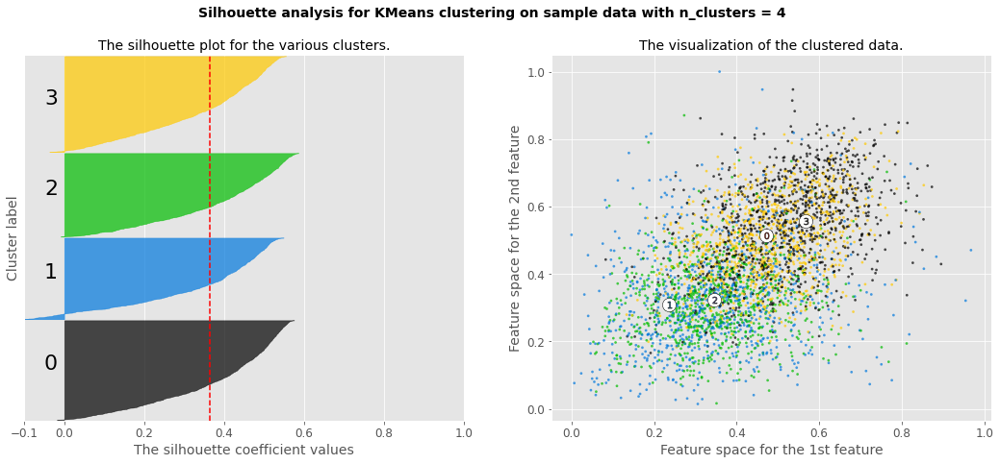

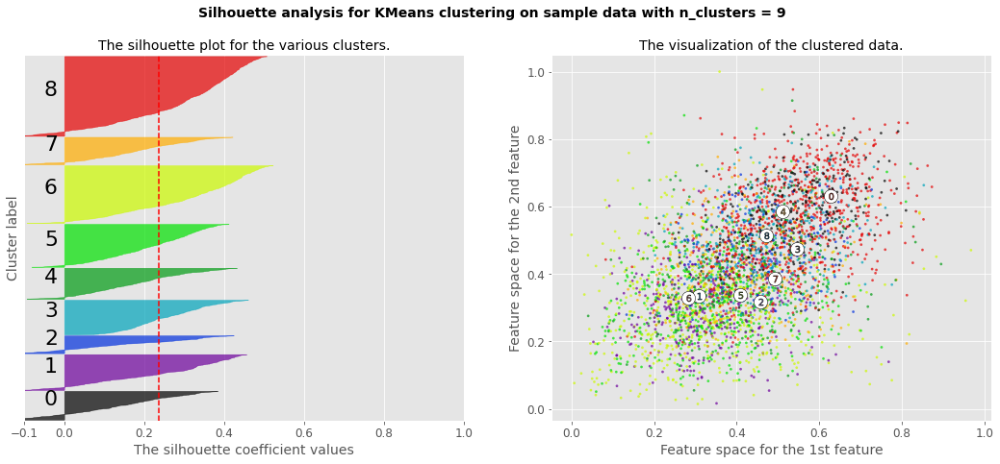

In [268]:
compara_silhouette_kmeds (np.asarray(DF1),[4,9])


Aplicamos el algoritmo kMeans para k=9. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [255]:
kmeds1 = KMedoids(n_clusters=9, random_state=10).fit(DF1)  

tmp1_med = pd.DataFrame({'Labels': DF.genre, 'Clusters': kmeds1.labels_})# Create a DataFrame with labels and varieties as columns: df
ct1_med = pd.crosstab(tmp1['Labels'], tmp1['Clusters']) # Create crosstab: ct
ct1_med

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,0,7,0,0,134,12,221,1,43
classical,0,29,0,0,12,19,251,0,0
death-metal,165,0,0,18,5,2,2,0,233
drum-and-bass,84,0,2,87,9,0,0,13,263
jazz,1,30,5,0,92,133,83,45,7
opera,0,277,0,0,3,75,37,2,0
singer-songwriter,0,36,20,23,17,207,12,128,2
ska,25,0,161,155,35,5,1,71,8
trance,30,0,1,84,22,2,4,31,290


Calculamos los indices de Rand y Van Dongen (Hopkins no discrimina por algoritmo, evalua el dataset en general)

In [256]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari1 = adjusted_rand_score(DF.genre, kmeds1.labels_)
ari1

0.27101408052718967

In [250]:
vanDongen(ct1_med)
# este es el mejor indice?

0.599935835739493

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411294]
Varianza explicada total 0.9748624635733926


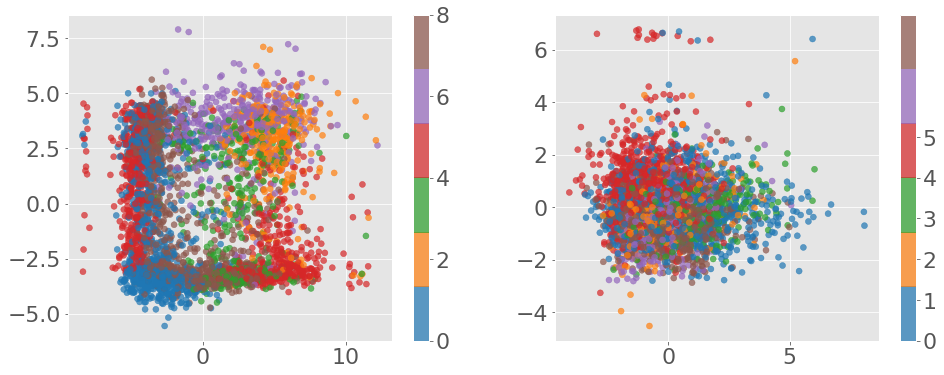

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF1)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

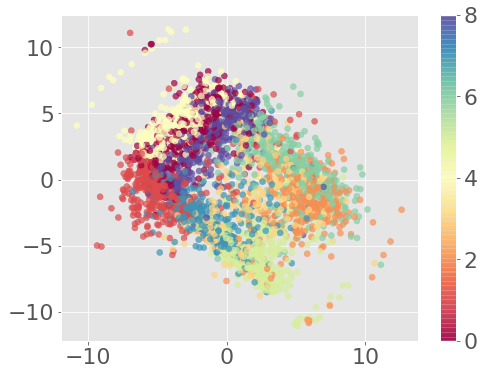

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

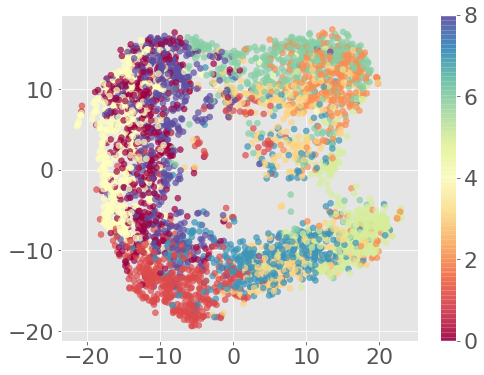

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

##DF2 - Sólo con las variables de timbres y pitches



Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

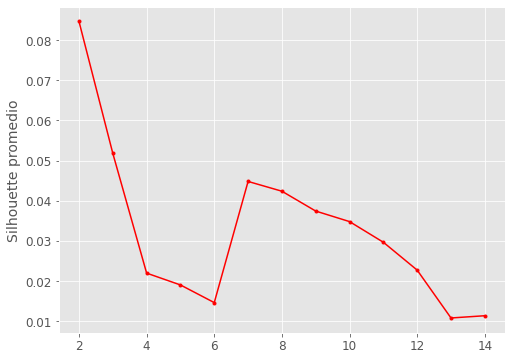

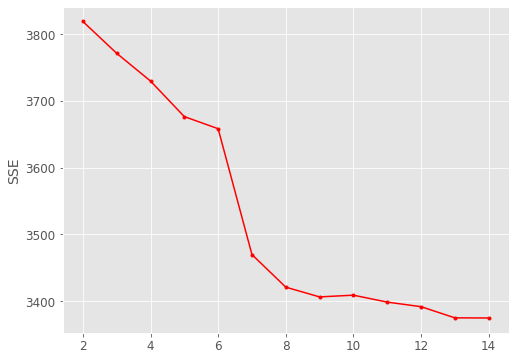

In [267]:
grafica_SIL_SSE_KMEDIODS(DF2_2)

For n_clusters = 7 The average silhouette_score is : 0.0448017345365107
For n_clusters = 9 The average silhouette_score is : 0.037420922713683115


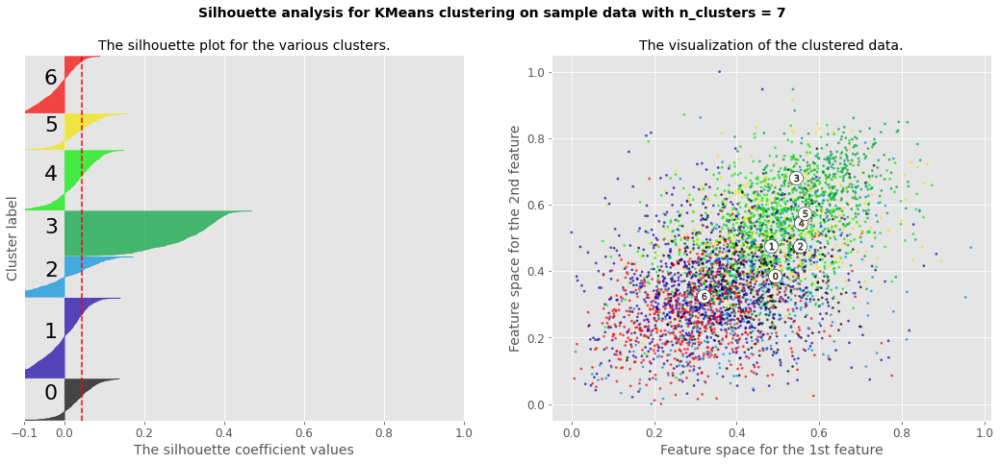

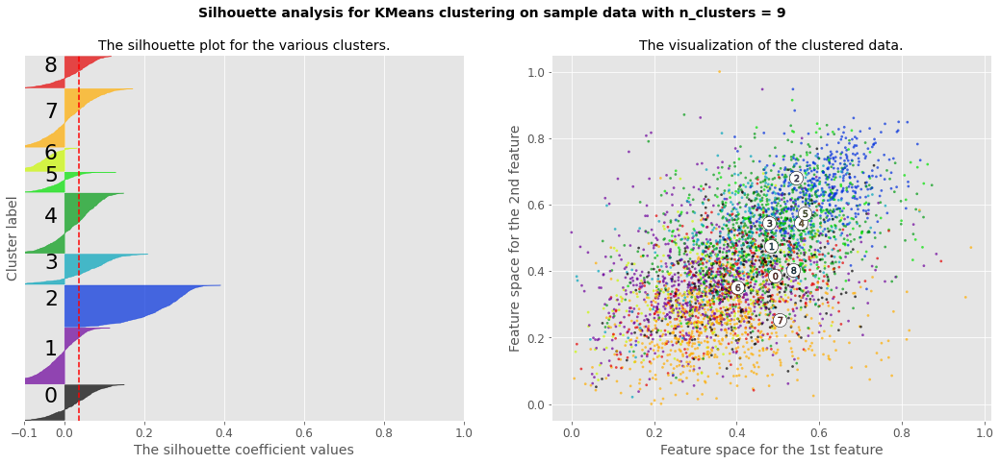

In [269]:
compara_silhouette_kmeds (np.asarray(DF2_2),[7,9])

Aplicamos el algoritmo kMeans para k=9. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [285]:
kmeds2 = KMedoids(n_clusters=9, random_state=10).fit(DF2_2)  

tmp2_med = pd.DataFrame({'Labels': DF2.genre, 'Clusters': kmeds2.labels_})# Create a DataFrame with labels and varieties as columns: df
ct2_med = pd.crosstab(tmp2['Labels'], tmp2['Clusters']) # Create crosstab: ct
ct2_med

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,100,21,5,115,75,61,35,7,23
classical,101,16,2,51,69,66,1,86,4
death-metal,2,36,440,1,2,1,3,1,0
drum-and-bass,3,184,5,14,6,12,226,1,26
jazz,14,43,0,48,23,14,32,30,217
opera,19,18,0,33,36,34,0,308,13
singer-songwriter,53,35,0,87,109,65,4,0,94
ska,2,270,31,9,7,12,18,0,128
trance,3,98,4,10,13,15,298,2,32


Calculamos los indices de Rand y Van Dongen (Hopkins no discrimina por algoritmo, evalua el dataset en general)

In [283]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari2 = adjusted_rand_score(DF2.genre, kmeds2.labels_)
ari2

0.20804876008511652

In [273]:
vanDongen(ct2_med)
# este es el mejor indice?

0.6015661707126077

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411294]
Varianza explicada total 0.9748624635733926


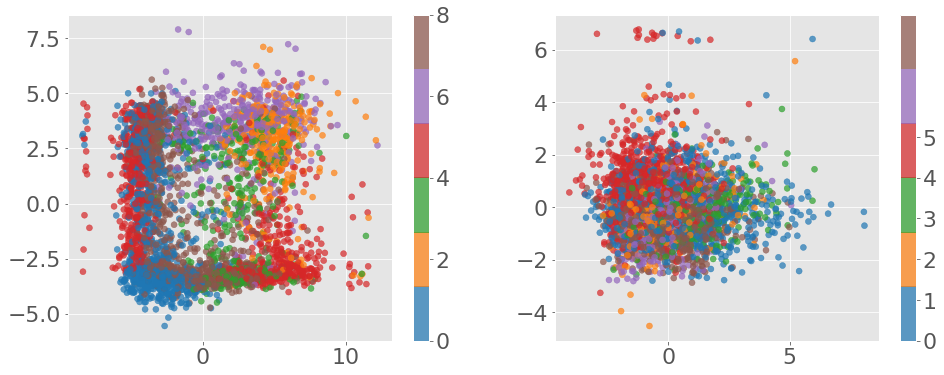

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF2_2)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

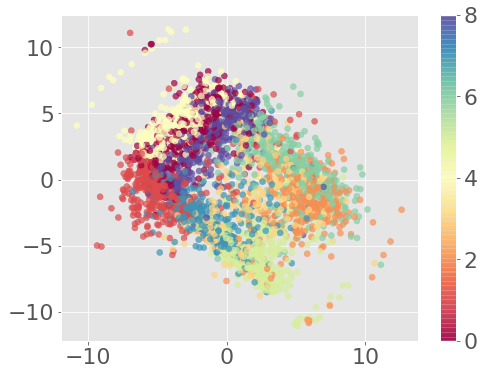

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

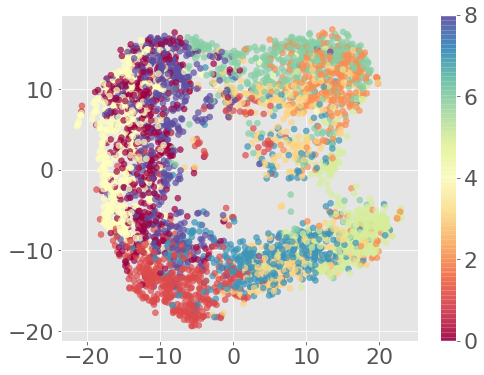

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF3 - Sólo con las variables de timbres



Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

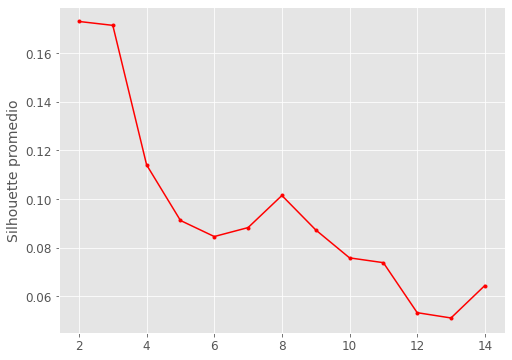

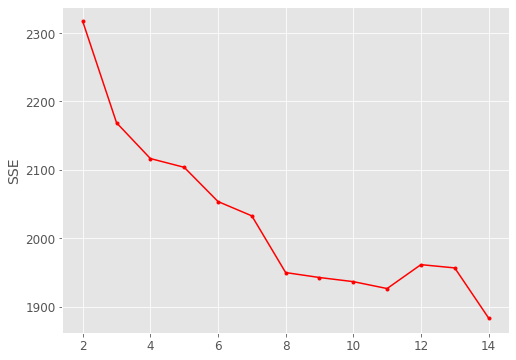

In [ ]:
grafica_SIL_SSE_KMEDIODS(DF3_2)

For n_clusters = 3 The average silhouette_score is : 0.17150898399828435
For n_clusters = 9 The average silhouette_score is : 0.08731264022406508


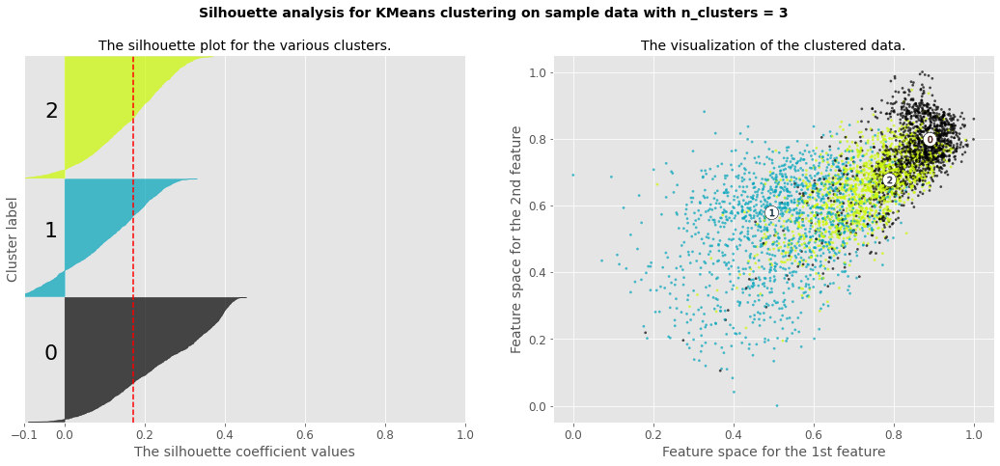

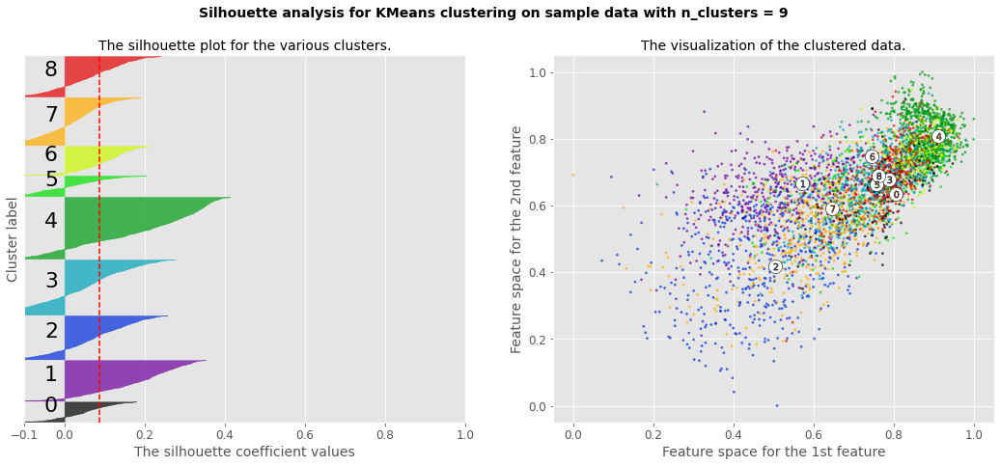

In [ ]:
compara_silhouette_kmeds (np.asarray(DF3_2),[3,9])

Aplicamos el algoritmo kMeans para k=9. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [ ]:
kmeds3 = KMedoids(n_clusters=9, random_state=10).fit(DF3_2)  

tmp3_med = pd.DataFrame({'Labels': DF3.genre, 'Clusters': kmeds3.labels_})# Create a DataFrame with labels and varieties as columns: df
ct3_med = pd.crosstab(tmp3['Labels'], tmp3['Clusters']) # Create crosstab: ct
ct3_med

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,1,112,16,20,134,9,16,13,121
classical,3,16,78,0,63,4,1,1,230
death-metal,2,0,0,41,1,435,0,2,5
drum-and-bass,17,5,0,267,0,6,20,161,1
jazz,74,145,23,19,7,1,126,14,12
opera,19,25,333,6,3,0,4,0,71
singer-songwriter,70,247,2,49,0,1,64,2,12
ska,265,4,0,119,0,27,58,4,0
trance,7,3,2,169,2,1,42,245,4


Calculamos los indices de Rand y Van Dongen (Hopkins no discrimina por algoritmo, evalua el dataset en general)

In [ ]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari3 = adjusted_rand_score(DF3.genre, kmeds3.labels_)
ari3

0.3069669646766555

In [ ]:
vanDongen(ct3_med)
# este es el mejor indice?

0.5182242990654206

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411294]
Varianza explicada total 0.9748624635733926


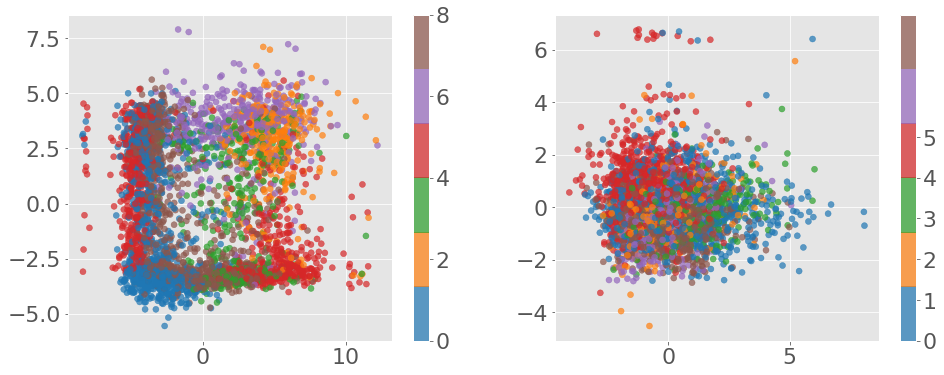

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF2_2)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

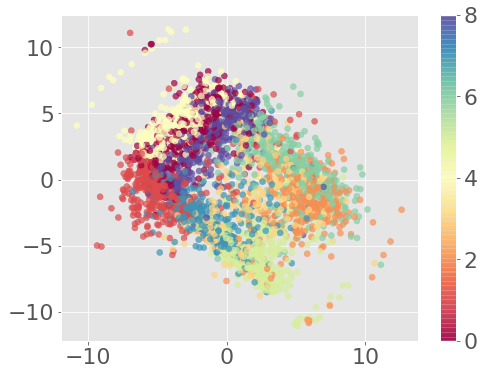

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

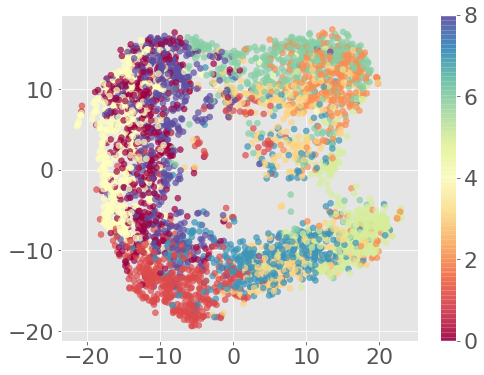

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

**T-distributed Stochastic Neighbor Embedding (TSNE)**

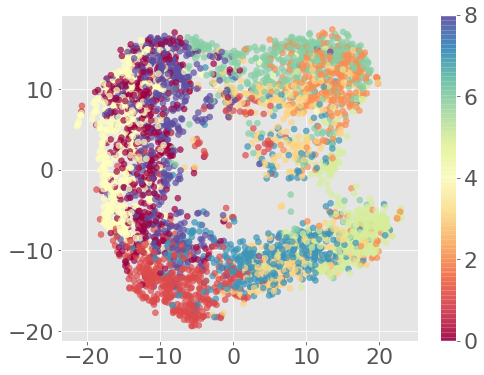

In [ ]:
tsne = TSNE(n_components=2,perplexity=200)
Xred = tsne.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF4 - Sólo con las variables de pitches



Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

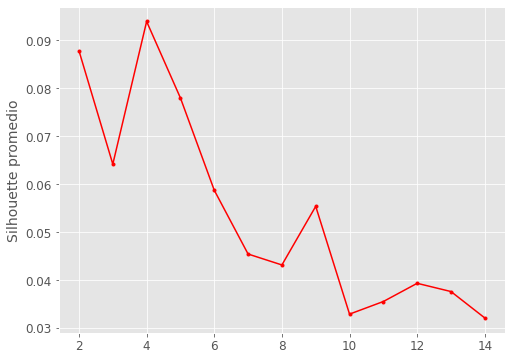

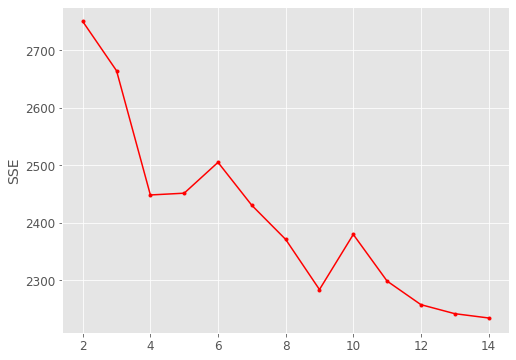

In [286]:
grafica_SIL_SSE_KMEDIODS(DF4_2)

For n_clusters = 4 The average silhouette_score is : 0.09389679873563998
For n_clusters = 9 The average silhouette_score is : 0.055346382720992446


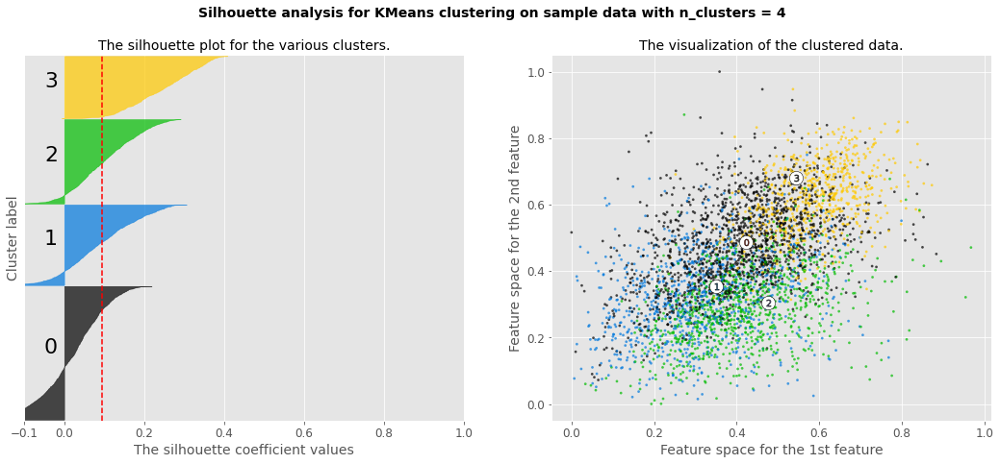

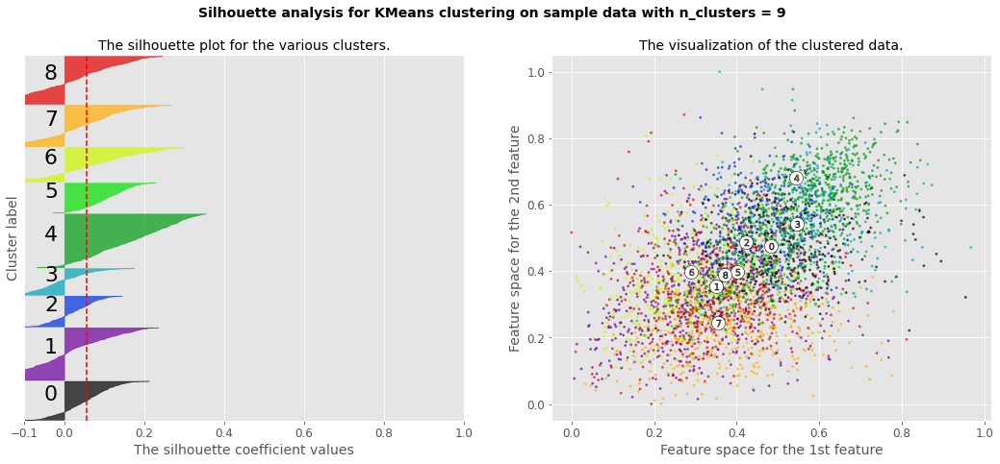

In [287]:
compara_silhouette_kmeds (np.asarray(DF4_2),[4,9])

Aplicamos el algoritmo kMeans para k=9. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [288]:
kmeds4 = KMedoids(n_clusters=9, random_state=10).fit(DF4_2)  

tmp4_med = pd.DataFrame({'Labels': DF4.genre, 'Clusters': kmeds4.labels_})# Create a DataFrame with labels and varieties as columns: df
ct4_med = pd.crosstab(tmp4['Labels'], tmp4['Clusters']) # Create crosstab: ct
ct4_med

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,6,57,41,39,79,84,56,33,47
classical,2,51,81,6,79,30,62,18,67
death-metal,395,2,3,21,1,1,1,50,12
drum-and-bass,11,0,22,131,0,9,21,215,68
jazz,11,5,165,33,19,35,20,47,86
opera,2,21,131,6,27,48,69,42,115
singer-songwriter,2,67,70,15,60,60,71,14,88
ska,70,3,40,53,7,19,37,88,160
trance,38,0,16,202,0,6,18,123,72


Calculamos los indices de Rand y Van Dongen (Hopkins no discrimina por algoritmo, evalua el dataset en general)

In [289]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari4 = adjusted_rand_score(DF4.genre, kmeds4.labels_)
ari4

0.12921394930621816

In [290]:
vanDongen(ct4_med)
# este es el mejor indice?

0.7475226195605342

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411294]
Varianza explicada total 0.9748624635733926


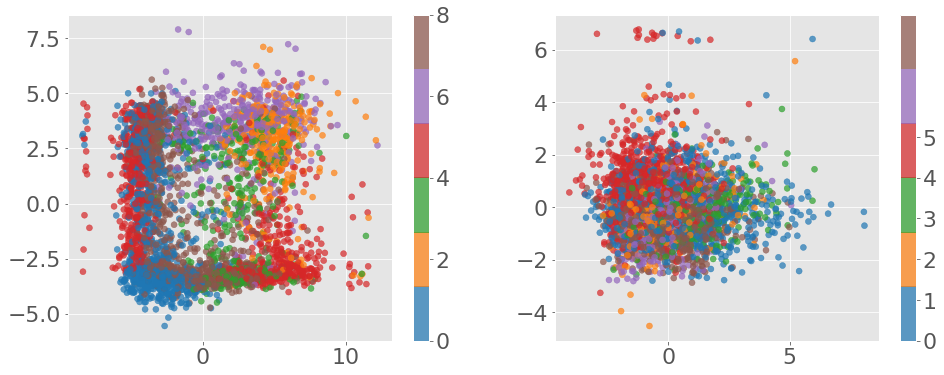

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF2_2)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

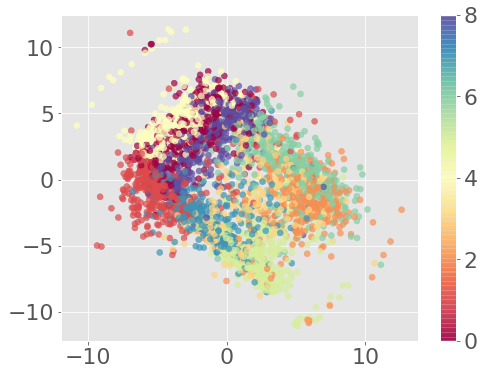

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

## DF5 - Sólo con Audio Features (Alto Nivel)

Con los gráficos del promedio de Silhouette y SSE, tratamos de ver cuál sería la cantidad optima de clusters para este conjunto de datos

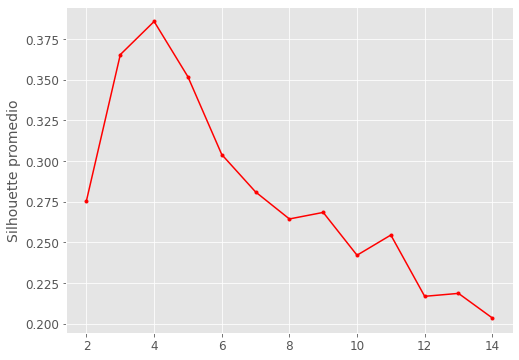

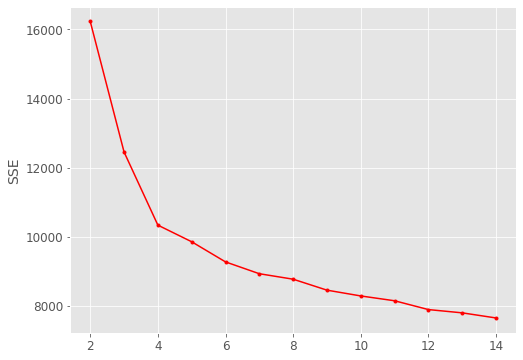

In [291]:
grafica_SIL_SSE_KMEDIODS(DF5_2)

For n_clusters = 4 The average silhouette_score is : 0.3857682958150732
For n_clusters = 9 The average silhouette_score is : 0.2683983282655062


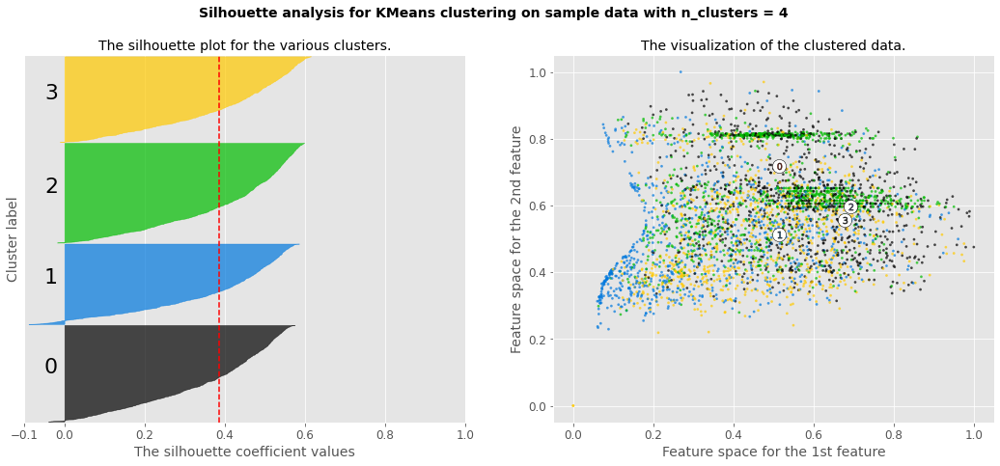

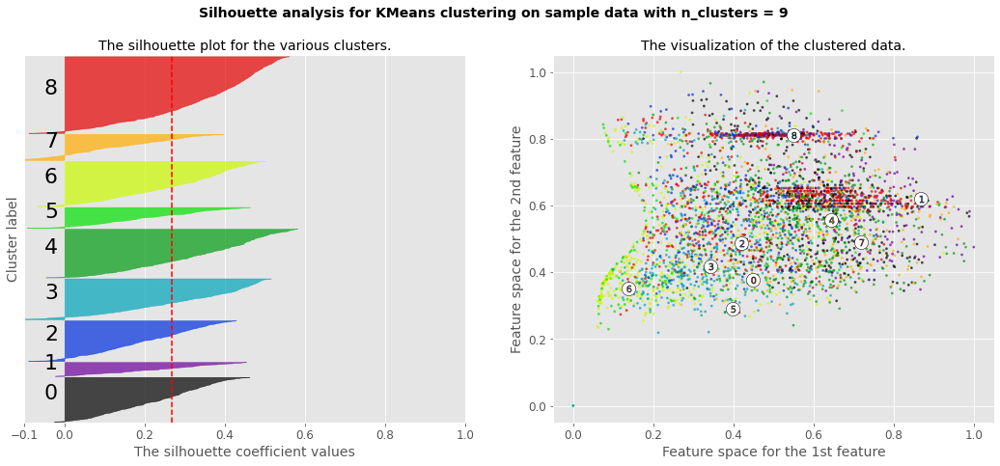

In [292]:
compara_silhouette_kmeds (np.asarray(DF5_2),[4,9])

Aplicamos el algoritmo kMeans para k=9. Generamos la matriz de confusion como método de validacion externa para ver si los agrupamientos son similares a los reales

In [293]:
kmeds5 = KMedoids(n_clusters=9, random_state=10).fit(DF5_2)  

tmp5_med = pd.DataFrame({'Labels': DF5.genre, 'Clusters': kmeds5.labels_})# Create a DataFrame with labels and varieties as columns: df
ct5_med = pd.crosstab(tmp5['Labels'], tmp5['Clusters']) # Create crosstab: ct
ct5_med

Clusters,0,1,2,3,4,5,6,7,8
Labels,,,,,,,,,
ambient,1,48,3,10,10,101,66,0,179
classical,0,6,0,9,36,157,0,0,103
death-metal,155,1,206,2,0,1,56,0,4
drum-and-bass,165,4,140,2,0,0,132,15,0
jazz,1,93,0,144,42,44,16,16,40
opera,0,4,0,67,286,28,0,0,9
singer-songwriter,25,15,0,275,47,6,3,67,7
ska,90,36,3,16,0,1,6,309,0
trance,129,10,60,5,0,2,228,28,2


Calculamos los indices de Rand y Van Dongen (Hopkins no discrimina por algoritmo, evalua el dataset en general)

In [294]:
from sklearn.metrics import adjusted_rand_score

# este es el mejor indice?
ari5 = adjusted_rand_score(DF5.genre, kmeds5.labels_)
ari5

0.278473079219397

In [295]:
vanDongen(ct5_med)
# este es el mejor indice?

0.5675468222290452

**PCA**

Varianza explicada [0.54116663 0.3022743  0.07402161 0.04643612 0.00685087 0.00411294]
Varianza explicada total 0.9748624635733926


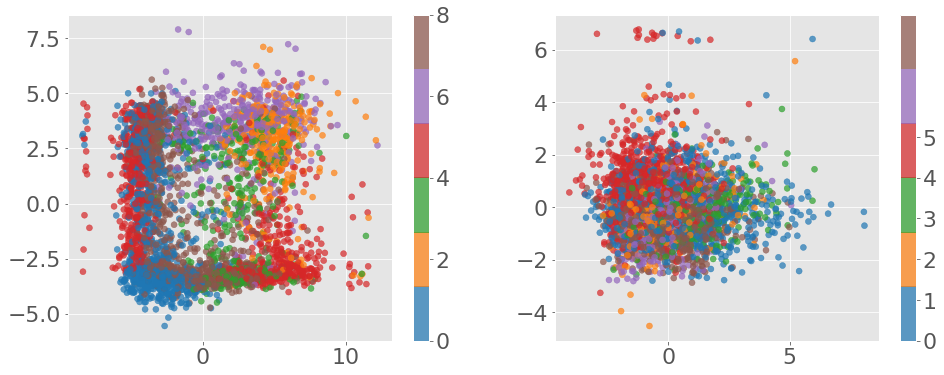

In [ ]:
pca = PCA(n_components=6)
Xred = pca.fit_transform(DF2_2)
Y=pd.factorize(DF.genre)[0]

cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', plt.cm.tab10(np.arange(6)), 6)

plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar();
plt.subplot(1,2,2)
plt.scatter(Xred[:,2],Xred[:,3],c=Y,cmap=cmap, alpha=0.7)
plt.colorbar(ticks=range(6));
print('Varianza explicada',pca.explained_variance_ratio_)
print('Varianza explicada total',pca.explained_variance_ratio_.sum())

**MDS**

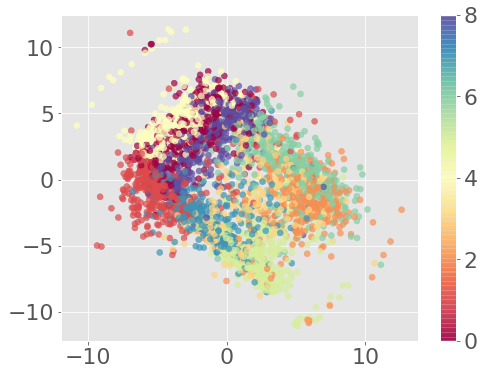

In [ ]:
mds = MDS(n_components=2, n_jobs = 8, eps=0.1, max_iter=500)
Xred = mds.fit_transform(DF2_2)
plt.scatter(Xred[:,0],Xred[:,1],c=Y,cmap=plt.cm.Spectral,alpha=0.7)
plt.colorbar();

# Algoritmo Jerárquico

##DF1 - Todas las variables numéricas, sin los NA

Primero evaluacion el indice/distancia cofenetico para ver cual metodo nos conviene usar.

LINKAGE=Perform hierarchical/agglomerative clustering.

In [370]:
indices_cofeneticos_varios(DF1)

Indice cofenetico para metodo centroide y metrica euclidean 0.5839154848590922
Indice cofenetico para metodo average y metrica euclidean 0.6428691788553033
Indice cofenetico para metodo complete y metrica euclidean 0.36083899805562525
Indice cofenetico para metodo single y metrica euclidean 0.5343467990832251
Indice cofenetico para metodo ward y metrica euclidean 0.47089821290526357
Indice cofenetico para metodo median y metrica euclidean 0.5314204967228542
Indice cofenetico para metodo average y metrica chebyshev 0.5559903878101033
Indice cofenetico para metodo complete y metrica chebyshev 0.30742365237835745
Indice cofenetico para metodo single y metrica chebyshev 0.5727389731412317
Indice cofenetico para metodo average y metrica mahalanobis 0.4878205010396831
Indice cofenetico para metodo complete y metrica mahalanobis 0.35671933960234997
Indice cofenetico para metodo single y metrica mahalanobis 0.4719290538830855


Aplicamos algoritmo jerarquico Aglomerativo con el mejor indice cofenetico

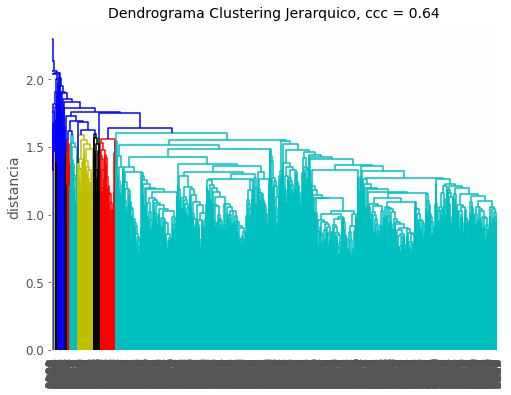

In [364]:
DF1_3=scaler.fit_transform(DF1)
z1 = linkage(DF1_3, method='average', metric='euclidean')
c,_=cophenet(z1,pdist(DF1_3))

plt.figure()
DN1 = dendrogram(z1)
plt.title('Dendrograma Clustering Jerarquico, ccc = %0.2f'%c, fontsize=14)
plt.ylabel('distancia', fontsize=14)
plt.tick_params(axis='both',labelsize=12)
plt.show()


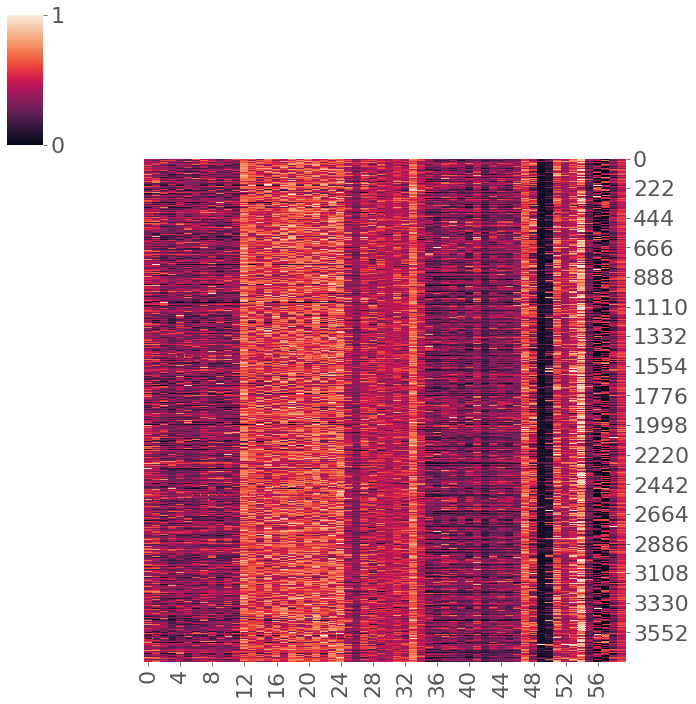

In [335]:
sns.clustermap(DF1_3, method='average', metric='euclidean',row_cluster=False,col_cluster=False)

Otra forma de ver el mismo dendograma anterior

/usr/local/lib/python3.6/dist-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


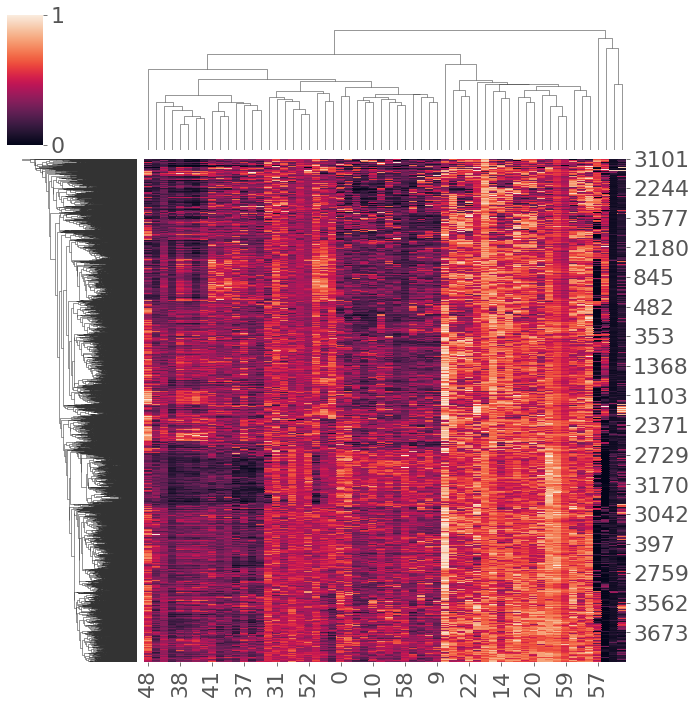

In [334]:
sns.clustermap(DF1_3, method='average', metric='euclidean')

### Indice Rand
Evaluamos el indice Rand en el jerarquico generado, segun distintos criterios

In [357]:
#fcluster
#Form flat clusters from the hierarchical clustering defined by the given linkage matrix.
cluster_labels = fcluster(z1,14, criterion='distance')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF.genre, cluster_labels))

[1 2 3 4 5 6 7]
5.9700009303597336e-05


In [355]:
cluster_labels = fcluster(z1, 9, criterion='maxclust')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.00011603455982845523


##DF2 - Sólo con las variables de timbres y pitches

Primero evaluacion el indice/distancia cofenetico para ver cual metodo nos conviene usar.

LINKAGE=Perform hierarchical/agglomerative clustering.

In [371]:
indices_cofeneticos_varios(DF2_2)

Indice cofenetico para metodo centroide y metrica euclidean 0.6423204859435492
Indice cofenetico para metodo average y metrica euclidean 0.6791483290069812
Indice cofenetico para metodo complete y metrica euclidean 0.3330323736280513
Indice cofenetico para metodo single y metrica euclidean 0.6118232144949796
Indice cofenetico para metodo ward y metrica euclidean 0.3535328945503854
Indice cofenetico para metodo median y metrica euclidean 0.5189700793839069
Indice cofenetico para metodo average y metrica chebyshev 0.647137475140395
Indice cofenetico para metodo complete y metrica chebyshev 0.3036663804558109
Indice cofenetico para metodo single y metrica chebyshev 0.6319207279802193
Indice cofenetico para metodo average y metrica mahalanobis 0.5565623645659676
Indice cofenetico para metodo complete y metrica mahalanobis 0.40035416926986106
Indice cofenetico para metodo single y metrica mahalanobis 0.5452943534578544


Aplicamos algoritmo jerarquico Aglomerativo con el mejor indice cofenetico

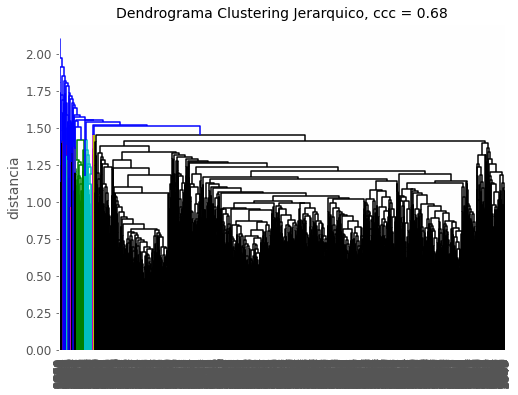

In [374]:
DF2_3=scaler.fit_transform(DF2_2)
z1 = linkage(DF2_3, method='average', metric='euclidean')
c,_=cophenet(z1,pdist(DF2_3))

plt.figure()
DN1 = dendrogram(z1)
plt.title('Dendrograma Clustering Jerarquico, ccc = %0.2f'%c, fontsize=14)
plt.ylabel('distancia', fontsize=14)
plt.tick_params(axis='both',labelsize=12)
plt.show()


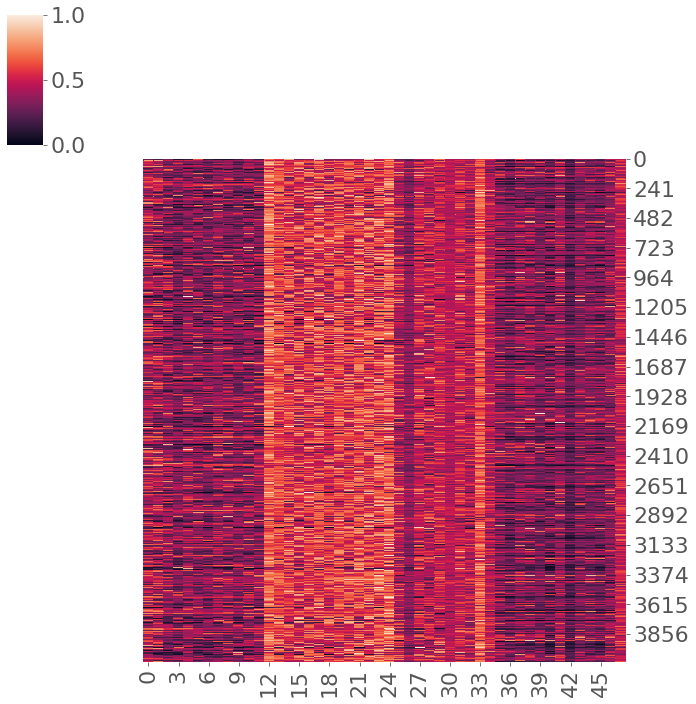

In [375]:
sns.clustermap(DF2_3, method='average', metric='euclidean',row_cluster=False,col_cluster=False)

Otra forma de ver el mismo dendograma anterior

/usr/local/lib/python3.6/dist-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


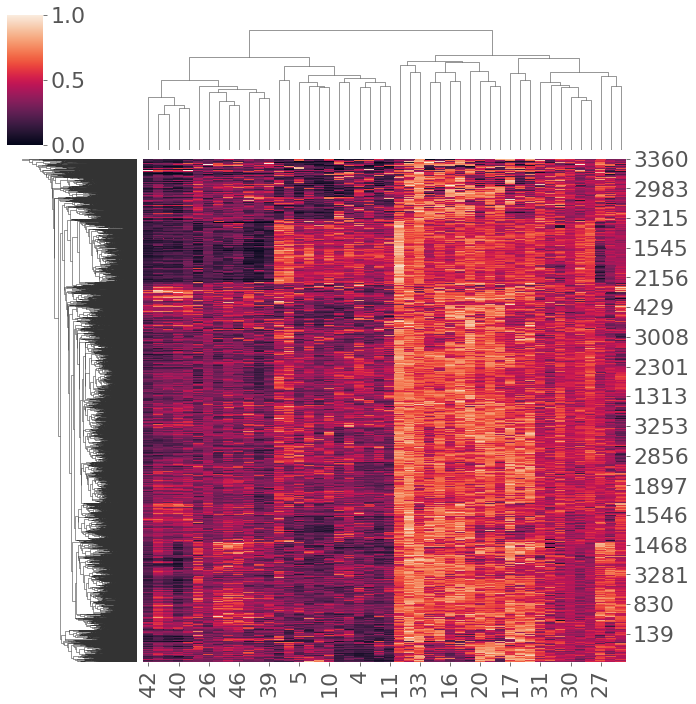

In [376]:
sns.clustermap(DF2_3, method='average', metric='euclidean')

### Indice Rand
Evaluamos el indice Rand en el jerarquico generado, segun distintos criterios

In [403]:
#fcluster
#Form flat clusters from the hierarchical clustering defined by the given linkage matrix.
cluster_labels = fcluster(z1,1.8, criterion='distance')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF2.genre, cluster_labels))

[1 2 3 4 5 6 7]
0.000584965938471288


In [380]:
cluster_labels = fcluster(z1, 9, criterion='maxclust')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF2.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.0011678666992467244


## DF3 - Sólo con las variables de timbres

Primero evaluacion el indice/distancia cofenetico para ver cual metodo nos conviene usar.

LINKAGE=Perform hierarchical/agglomerative clustering.

In [404]:
indices_cofeneticos_varios(DF3_2)

Indice cofenetico para metodo centroide y metrica euclidean 0.6169091021844606
Indice cofenetico para metodo average y metrica euclidean 0.6269686707753904
Indice cofenetico para metodo complete y metrica euclidean 0.3893336601532989
Indice cofenetico para metodo single y metrica euclidean 0.4637221290498104
Indice cofenetico para metodo ward y metrica euclidean 0.4295619713379506
Indice cofenetico para metodo median y metrica euclidean 0.4688496432899131
Indice cofenetico para metodo average y metrica chebyshev 0.6222517688356394
Indice cofenetico para metodo complete y metrica chebyshev 0.4002444688406753
Indice cofenetico para metodo single y metrica chebyshev 0.481521737602178
Indice cofenetico para metodo average y metrica mahalanobis 0.434096687250896
Indice cofenetico para metodo complete y metrica mahalanobis 0.2665711614042721
Indice cofenetico para metodo single y metrica mahalanobis 0.3763271704442318


Aplicamos algoritmo jerarquico Aglomerativo con el mejor indice cofenetico

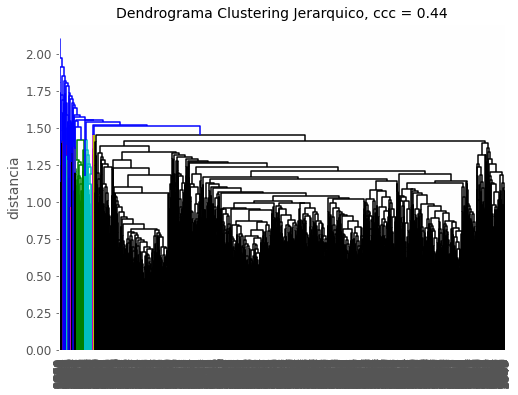

In [405]:
DF3_3=scaler.fit_transform(DF3_2)
z1 = linkage(DF3_3, method='average', metric='euclidean')
c,_=cophenet(z1,pdist(DF3_3))

plt.figure()
DN1 = dendrogram(z1)
plt.title('Dendrograma Clustering Jerarquico, ccc = %0.2f'%c, fontsize=14)
plt.ylabel('distancia', fontsize=14)
plt.tick_params(axis='both',labelsize=12)
plt.show()


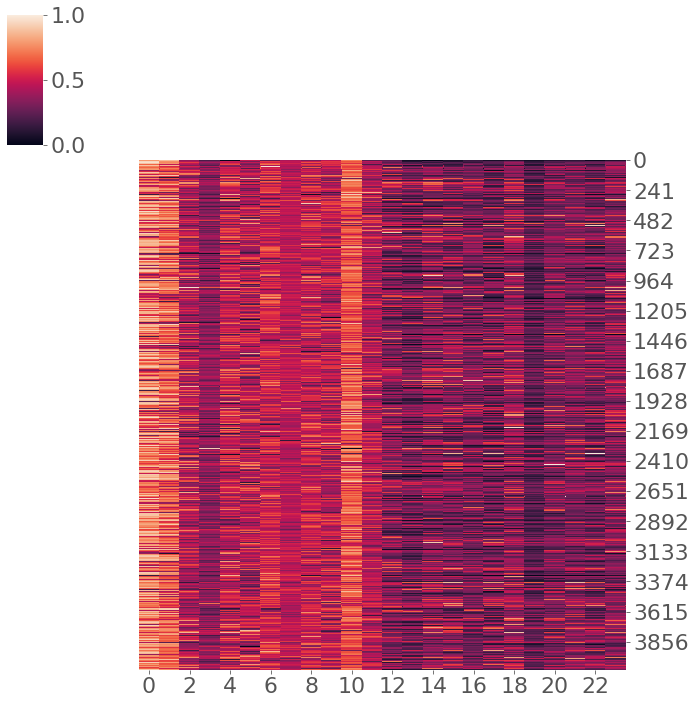

In [406]:
sns.clustermap(DF3_3, method='average', metric='euclidean',row_cluster=False,col_cluster=False)

Otra forma de ver el mismo dendograma anterior

/usr/local/lib/python3.6/dist-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


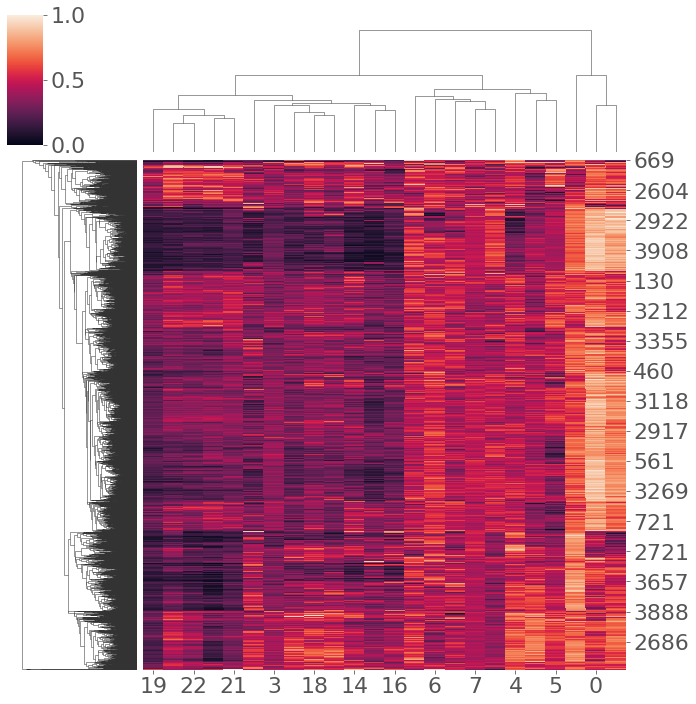

In [407]:
sns.clustermap(DF3_3, method='average', metric='euclidean')

### Indice Rand
Evaluamos el indice Rand en el jerarquico generado, segun distintos criterios

In [411]:
#fcluster
#Form flat clusters from the hierarchical clustering defined by the given linkage matrix.
cluster_labels = fcluster(z1,1.8, criterion='distance')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF3.genre, cluster_labels))

[1 2 3 4 5 6 7]
0.000584965938471288


In [412]:
cluster_labels = fcluster(z1, 9, criterion='maxclust')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF3.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.0011678666992467244


## DF4 - Sólo con las variables de pitches

Primero evaluacion el indice/distancia cofenetico para ver cual metodo nos conviene usar.

LINKAGE=Perform hierarchical/agglomerative clustering.

In [413]:
indices_cofeneticos_varios(DF4_2)

Indice cofenetico para metodo centroide y metrica euclidean 0.698695150290856
Indice cofenetico para metodo average y metrica euclidean 0.699667141080475
Indice cofenetico para metodo complete y metrica euclidean 0.5203466194905766
Indice cofenetico para metodo single y metrica euclidean 0.6599046638092292
Indice cofenetico para metodo ward y metrica euclidean 0.33009626525778335
Indice cofenetico para metodo median y metrica euclidean 0.5340219270544478
Indice cofenetico para metodo average y metrica chebyshev 0.6804630016292588
Indice cofenetico para metodo complete y metrica chebyshev 0.36474813720384147
Indice cofenetico para metodo single y metrica chebyshev 0.681774324008902
Indice cofenetico para metodo average y metrica mahalanobis 0.6312195331319028
Indice cofenetico para metodo complete y metrica mahalanobis 0.41127818423537105
Indice cofenetico para metodo single y metrica mahalanobis 0.6273055851290128


Aplicamos algoritmo jerarquico Aglomerativo con el mejor indice cofenetico

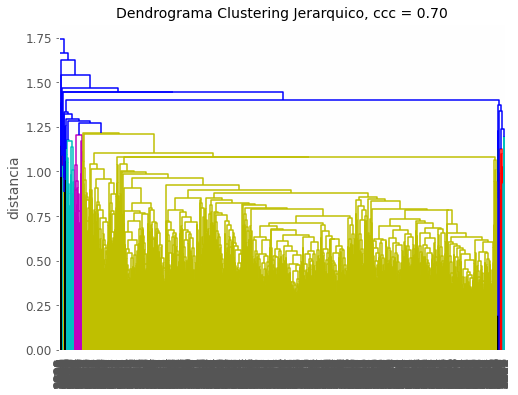

In [414]:
DF4_3=scaler.fit_transform(DF4_2)
z1 = linkage(DF4_3, method='average', metric='euclidean')
c,_=cophenet(z1,pdist(DF4_3))

plt.figure()
DN1 = dendrogram(z1)
plt.title('Dendrograma Clustering Jerarquico, ccc = %0.2f'%c, fontsize=14)
plt.ylabel('distancia', fontsize=14)
plt.tick_params(axis='both',labelsize=12)
plt.show()


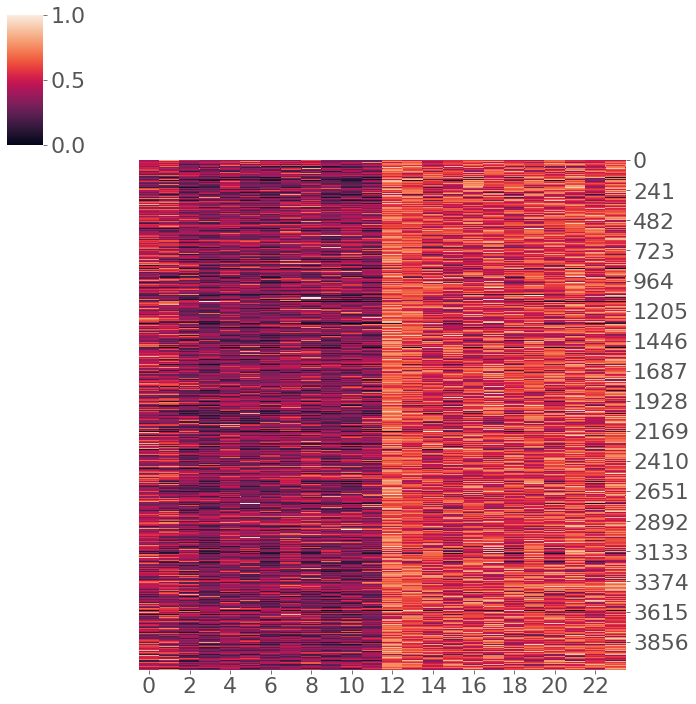

In [415]:
sns.clustermap(DF4_3, method='average', metric='euclidean',row_cluster=False,col_cluster=False)

Otra forma de ver el mismo dendograma anterior

/usr/local/lib/python3.6/dist-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


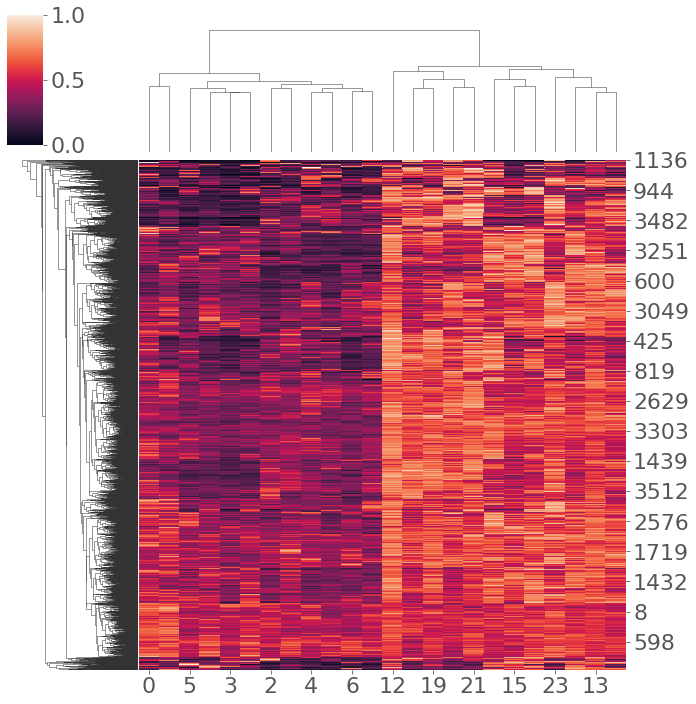

In [416]:
sns.clustermap(DF4_3, method='average', metric='euclidean')

### Indice Rand
Evaluamos el indice Rand en el jerarquico generado, segun distintos criterios

In [425]:
#fcluster
#Form flat clusters from the hierarchical clustering defined by the given linkage matrix.
cluster_labels = fcluster(z1,1.4, criterion='distance')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF4.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.00046595291814487415


In [424]:
cluster_labels = fcluster(z1, 9, criterion='maxclust')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF4.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.00046595291814487415


## DF5 - Sólo con Audio Features (Alto Nivel)

Primero evaluacion el indice/distancia cofenetico para ver cual metodo nos conviene usar.

LINKAGE=Perform hierarchical/agglomerative clustering.

In [426]:
indices_cofeneticos_varios(DF5_2)

Indice cofenetico para metodo centroide y metrica euclidean 0.6125096751316984
Indice cofenetico para metodo average y metrica euclidean 0.6295057480046169
Indice cofenetico para metodo complete y metrica euclidean 0.5432644705259062
Indice cofenetico para metodo single y metrica euclidean 0.2564770141288501
Indice cofenetico para metodo ward y metrica euclidean 0.5894990909650247
Indice cofenetico para metodo median y metrica euclidean 0.44618944113593384
Indice cofenetico para metodo average y metrica chebyshev 0.6265552633446365
Indice cofenetico para metodo complete y metrica chebyshev 0.34898831602207603
Indice cofenetico para metodo single y metrica chebyshev 0.288121502923469
Indice cofenetico para metodo average y metrica mahalanobis 0.361093242929888
Indice cofenetico para metodo complete y metrica mahalanobis 0.20506496345405759
Indice cofenetico para metodo single y metrica mahalanobis 0.26369852531112703


Aplicamos algoritmo jerarquico Aglomerativo con el mejor indice cofenetico

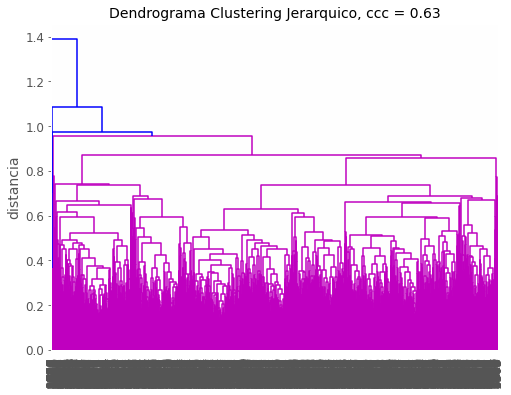

In [427]:
DF5_3=scaler.fit_transform(DF5_2)
z1 = linkage(DF5_3, method='average', metric='euclidean')
c,_=cophenet(z1,pdist(DF5_3))

plt.figure()
DN1 = dendrogram(z1)
plt.title('Dendrograma Clustering Jerarquico, ccc = %0.2f'%c, fontsize=14)
plt.ylabel('distancia', fontsize=14)
plt.tick_params(axis='both',labelsize=12)
plt.show()


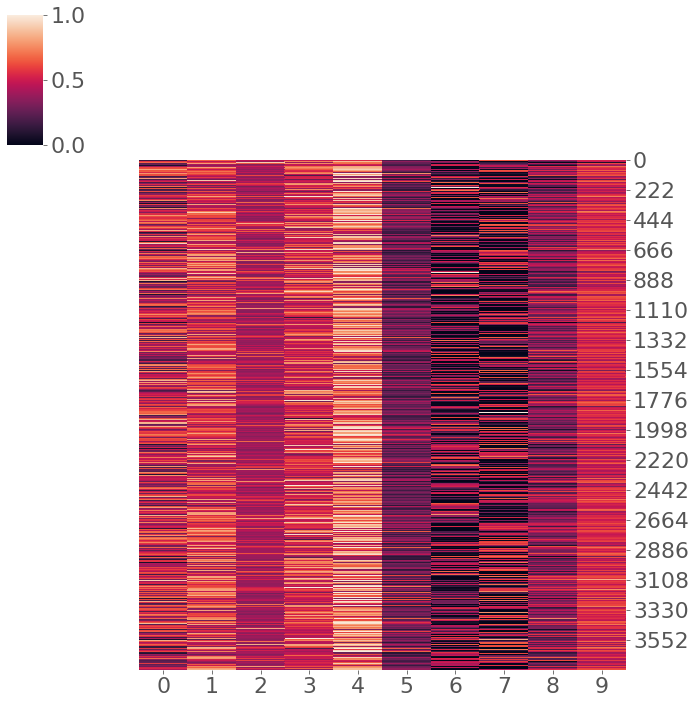

In [428]:
sns.clustermap(DF5_3, method='average', metric='euclidean',row_cluster=False,col_cluster=False)

Otra forma de ver el mismo dendograma anterior

/usr/local/lib/python3.6/dist-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


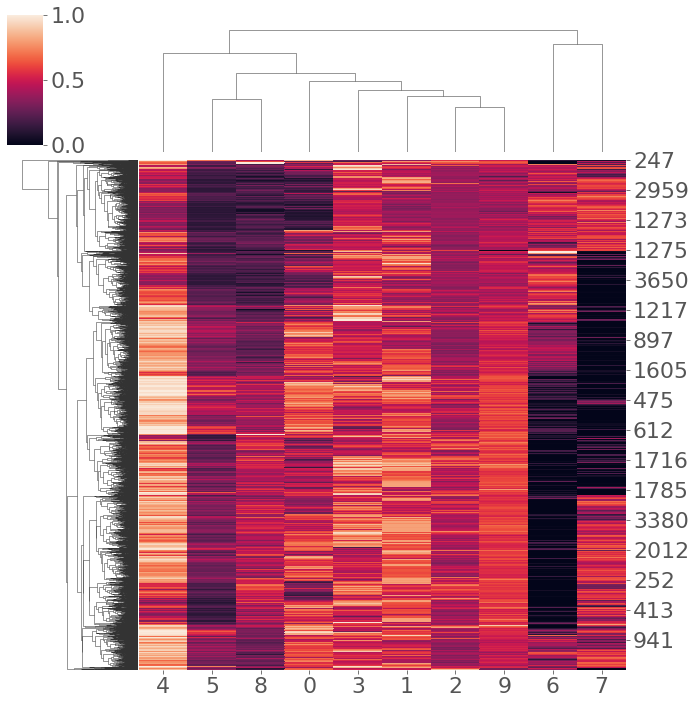

In [429]:
sns.clustermap(DF5_3, method='average', metric='euclidean')

### Indice Rand
Evaluamos el indice Rand en el jerarquico generado, segun distintos criterios

In [433]:
#fcluster
#Form flat clusters from the hierarchical clustering defined by the given linkage matrix.
cluster_labels = fcluster(z1,0.8, criterion='distance')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF5.genre, cluster_labels))

[1 2 3 4 5 6 7]
0.10349657932043058


In [434]:
cluster_labels = fcluster(z1, 9, criterion='maxclust')
print(np.unique(cluster_labels))
print(adjusted_rand_score(DF5.genre, cluster_labels))

[1 2 3 4 5 6 7 8 9]
0.10345850365886704
